In [1]:
import meep as mp
import meep.adjoint as mpa
from meep import Animate2D
import numpy as np
from autograd import numpy as npa
from autograd import tensor_jacobian_product, grad
import nlopt
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
from meep.materials import Ag
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
#from meep.materials import c-Si


os.makedirs(f'PICTURE',exist_ok=True)
mp.verbosity(0)
TiO2 = mp.Medium(index=2.6)
SiO2 = mp.Medium(index=1.44)
Si = mp.Medium(index=3.4)
Air = mp.Medium(index=1)

In [2]:
resolution = 100
design_region_resolution = int(resolution)

design_region_x_width  = 1   #100 nm
design_region_y_height = 1   #100 nm
design_region_z_height = 0.01  #20 nm or 10nm

pml_size = 1.0
pml_layers = [mp.PML(pml_size,direction=mp.Z)]

Sz_size = 0.6
Sx = design_region_x_width
Sy = design_region_y_height 
Sz = 2 * pml_size + design_region_z_height + Sz_size
cell_size = mp.Vector3(Sx, Sy, Sz)

wavelengths = np.array([1.55])     # wavelengths = np.array([1.5 ,1.55, 1.6])
frequencies = np.array([1 / 1.55])

nf = 1                 #3 #wavelengths Number

minimum_length = 0.01  # minimum length scale (microns)
eta_i = 0.5            # blueprint (or intermediate) design field thresholding point (between 0 and 1)
eta_e = 0.55           # erosion design field thresholding point (between 0 and 1)
eta_d = 1 - eta_e      # dilation design field thresholding point (between 0 and 1)
filter_radius = mpa.get_conic_radius_from_eta_e(minimum_length, eta_e)

Source_distance = -0.2

fcen   = 1 / 1.55
width  = 0.2  
fwidth = width * fcen
source_center = mp.Vector3(0,0,Source_distance)  
source_size   = mp.Vector3(design_region_x_width, design_region_y_height, 0)
src    = mp.GaussianSource(frequency=fcen, fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ey, size=source_size, center=source_center)]   

Nx = int(design_region_resolution * design_region_x_width) + 1
Ny = int(design_region_resolution * design_region_y_height) + 1
Nz = 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny, Nz), Air, Si, grid_type="U_MEAN")
design_region    = mpa.DesignRegion(
            design_variables,
            volume=mp.Volume(
            center=mp.Vector3(0,0,0),
            size=mp.Vector3(design_region_x_width, design_region_y_height, design_region_z_height),
            ),
)

def mapping(x, eta, beta):
    # filter
    filtered_field = mpa.conic_filter(
        x,
        filter_radius,
        design_region_x_width,
        design_region_y_height,
        design_region_resolution,
    )
    # projection
    projected_field = mpa.tanh_projection(filtered_field, beta, eta)
    projected_field = (npa.fliplr(projected_field) + projected_field) / 2
    projected_field = (npa.flipud(projected_field) + projected_field) / 2  # left-right symmetry    
    
    return projected_field.flatten()


geometry = [mp.Block(center=design_region.center, size=design_region.size, material=design_variables)]

kpoint = mp.Vector3()  # Periodic Boundary
sim = mp.Simulation(
    cell_size        = cell_size,
    boundary_layers  = pml_layers,
    geometry         = geometry,
    sources          = source,
    default_material = Air,
    k_point          = kpoint,
    symmetries       = [mp.Mirror(direction=mp.X)], 
    resolution       = resolution,
    extra_materials  = [Ag],       # Introducing metal complex terms
)
#---------------------------------------------------------------------------------------------------#


#-----------------[4]---------------------------------#
monitor_position   = mp.Vector3(0, 0, 0)       # Focus position
monitor_size       = mp.Vector3(0.01,0.01,0.01)     # Focus Size//////0.11
FourierFields_x    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ex,yee_grid=False)
FourierFields_y    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ey,yee_grid=False)
FourierFields_z    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ez,yee_grid=False)
ob_list            = [FourierFields_x,FourierFields_y,FourierFields_z]


def J(fields_x,fields_y,fields_z):
    ET_x = npa.abs(fields_x) ** 2
    ET_y = npa.abs(fields_y) ** 2
    ET_z = npa.abs(fields_z) ** 2
    ET = npa.sqrt( npa.mean(ET_x) + npa.mean(ET_y) + npa.mean(ET_z) )  
    return ET


opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=[J],
    objective_arguments=ob_list,
    design_regions=[design_region],
    frequencies=frequencies,
    decimation_factor = 1 ,           # KEY BUG!!
    maximum_run_time=50,
)

[0.50289784 0.50202677 0.50166986 ... 0.50166986 0.50202677 0.50289784]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


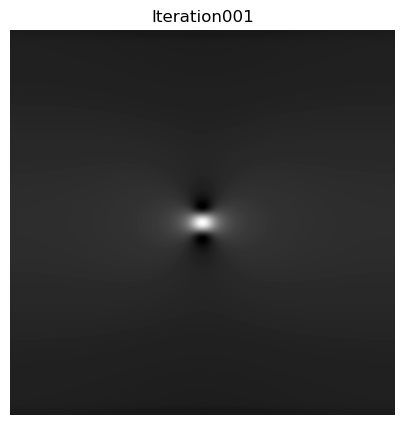

[0.53290542 0.5237427  0.51987018 ... 0.51987018 0.5237427  0.53290542]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


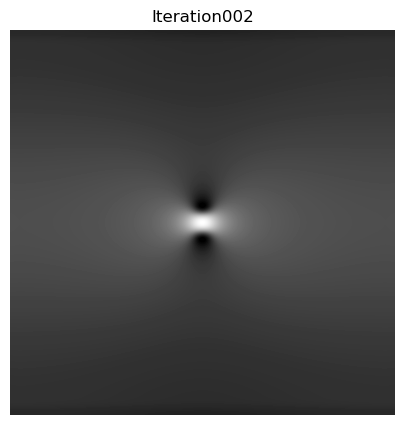

[0.84542939 0.80300047 0.78364287 ... 0.78364287 0.80300047 0.84542939]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


/home/ming/anaconda3/envs/mp/lib/python3.8/site-packages/meep/geom.py:588: UserWarning: The weights parameter of MaterialGrid must be in the range [0,1].
  warnings.warn(


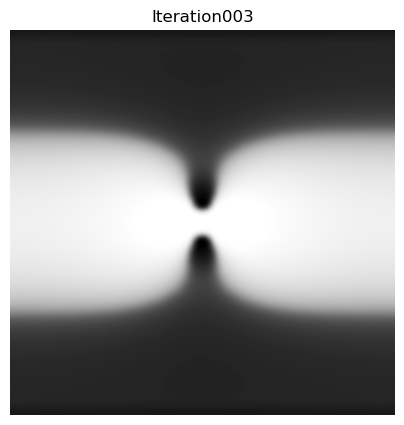

[0.86041838 0.81494592 0.79518052 ... 0.79518052 0.81494592 0.86041838]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


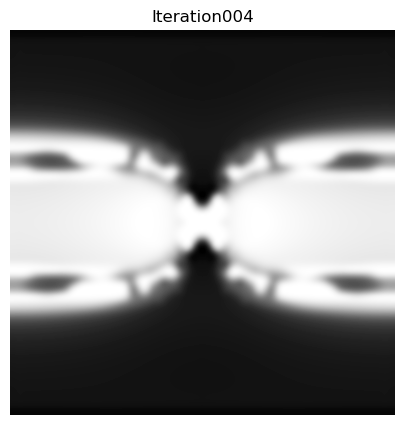

[0.84721542 0.80441092 0.78500351 ... 0.78500351 0.80441092 0.84721542]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


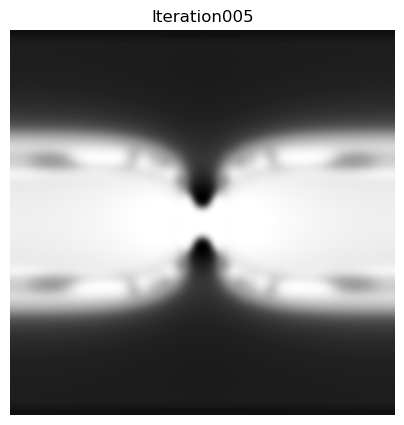

[0.84757611 0.80469548 0.78527773 ... 0.78527773 0.80469548 0.84757611]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


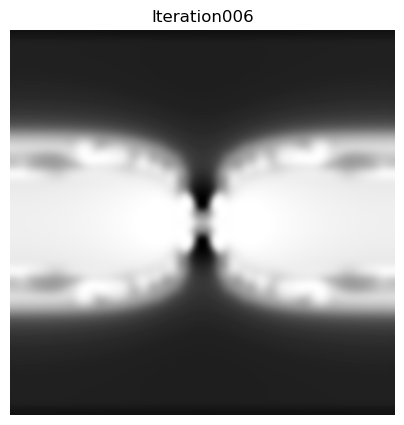

[0.84763883 0.80474494 0.78532535 ... 0.78532535 0.80474494 0.84763883]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


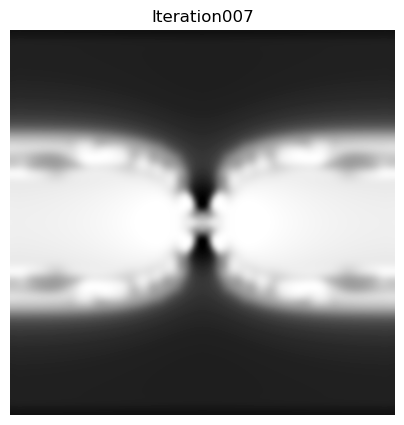

[0.84768289 0.80477968 0.78535879 ... 0.78535879 0.80477968 0.84768289]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


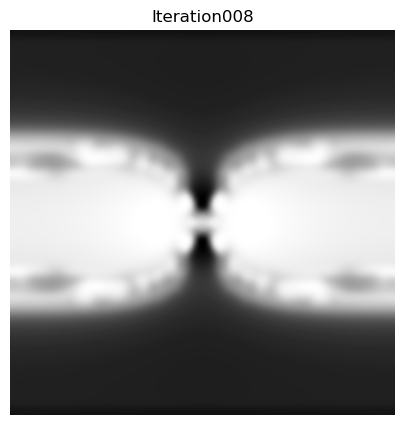

[0.84772247 0.80481092 0.78538894 ... 0.78538894 0.80481092 0.84772247]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


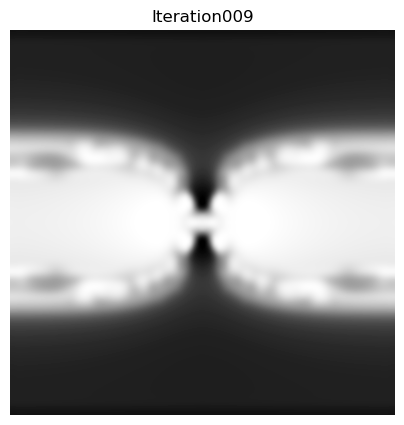

[0.84769353 0.80478808 0.7853669  ... 0.7853669  0.80478808 0.84769353]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


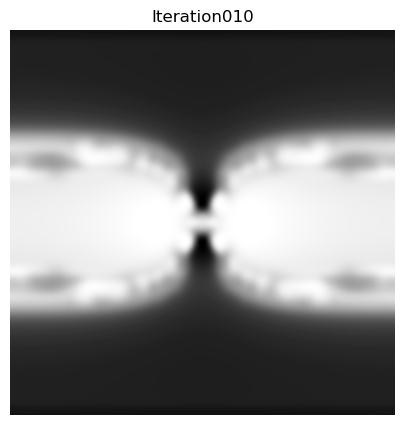

[0.84797604 0.8050112  0.78558235 ... 0.78558235 0.8050112  0.84797604]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


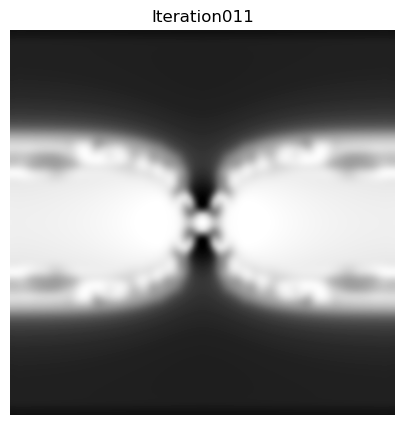

[0.84775608 0.80483747 0.78541459 ... 0.78541459 0.80483747 0.84775608]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


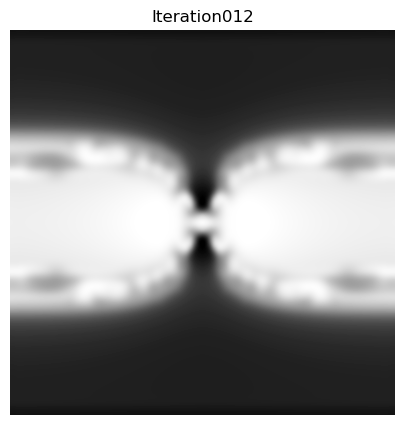

[0.84771182 0.80480252 0.78538084 ... 0.78538084 0.80480252 0.84771182]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


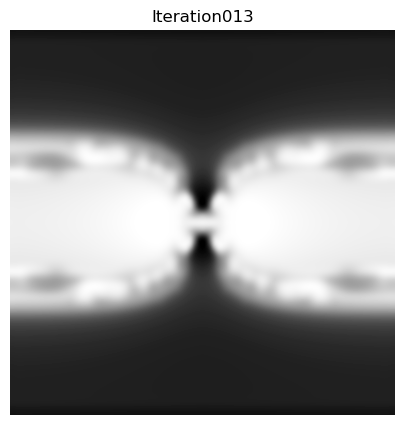

[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


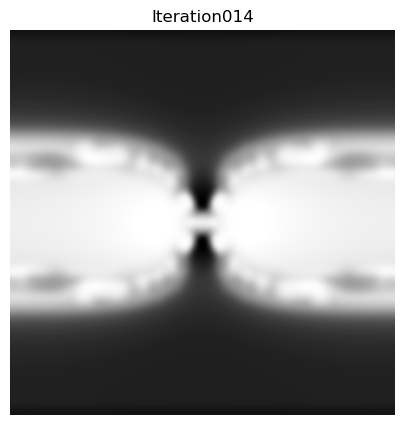

[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


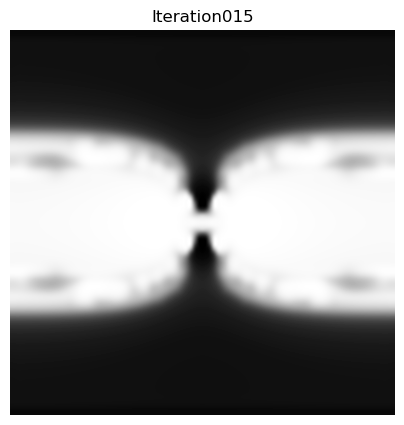

[0.84871225 0.80570988 0.78639944 ... 0.78639944 0.80570988 0.84871225]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


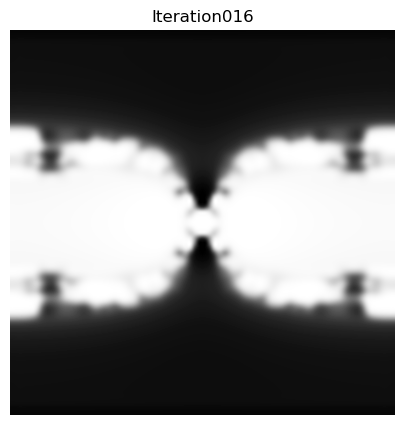

[0.84780157 0.80488514 0.78547495 ... 0.78547495 0.80488514 0.84780157]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


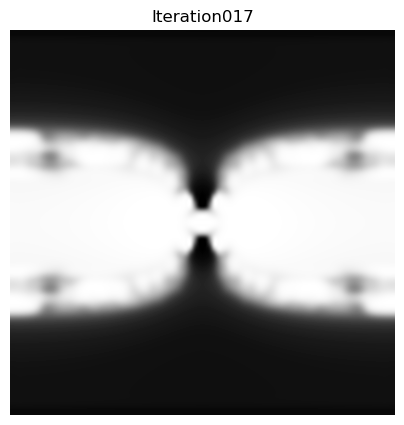

[0.84771967 0.80481099 0.7853918  ... 0.7853918  0.80481099 0.84771967]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


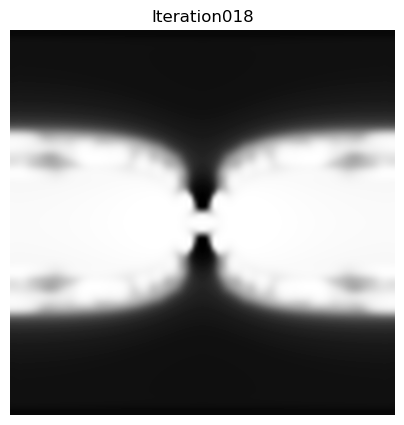

[0.84770578 0.80479842 0.7853777  ... 0.7853777  0.80479842 0.84770578]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


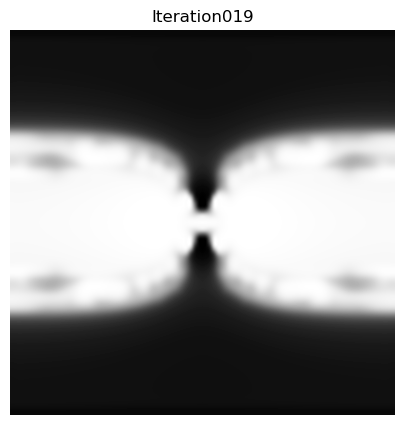

[0.84770214 0.80479512 0.785374   ... 0.785374   0.80479512 0.84770214]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


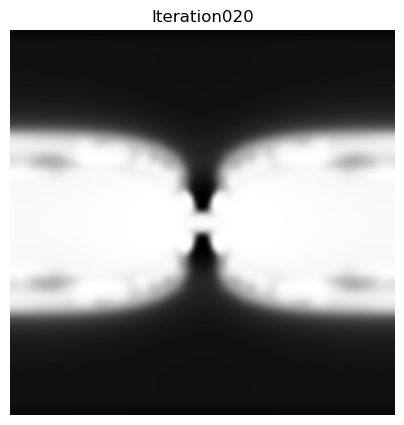

[0.84770599 0.80479861 0.78537791 ... 0.78537791 0.80479861 0.84770599]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


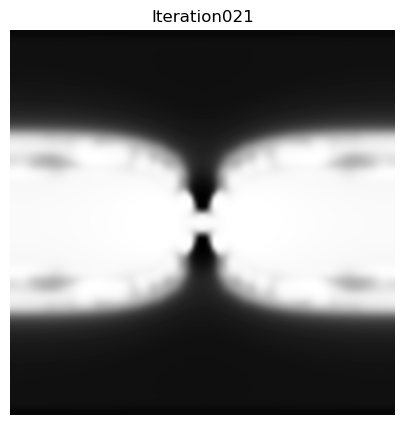

[0.84770325 0.80479613 0.78537513 ... 0.78537513 0.80479613 0.84770325]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


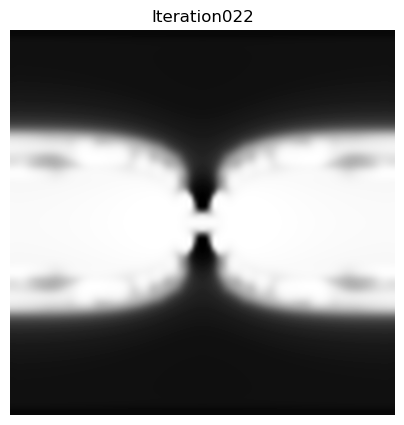

[0.84770236 0.80479533 0.78537423 ... 0.78537423 0.80479533 0.84770236]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


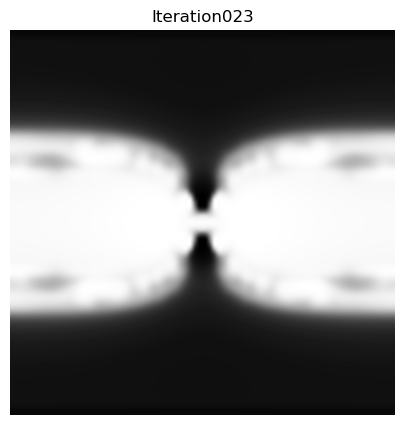

[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


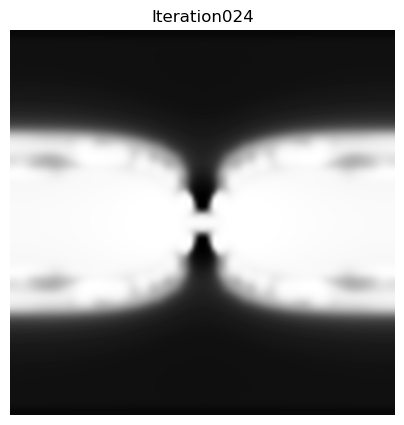

[0.84770225 0.80479522 0.78537412 ... 0.78537412 0.80479522 0.84770225]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


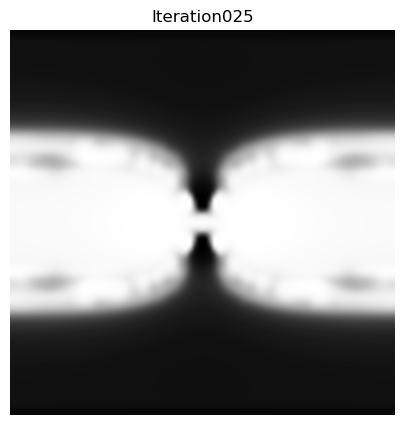

[0.84770222 0.80479521 0.7853741  ... 0.7853741  0.80479521 0.84770222]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


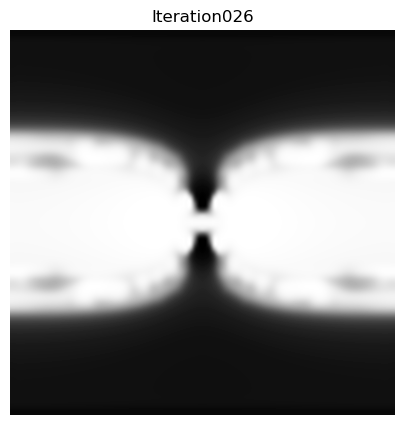

[0.84770222 0.8047952  0.78537409 ... 0.78537409 0.8047952  0.84770222]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


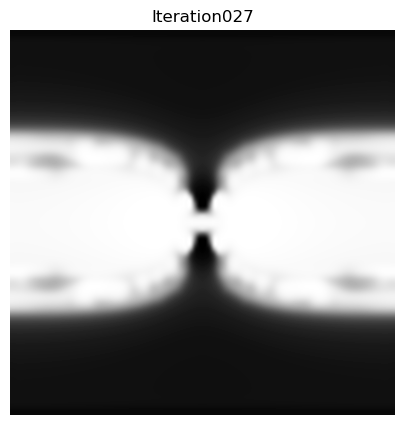

[0.84770221 0.8047952  0.78537408 ... 0.78537408 0.8047952  0.84770221]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


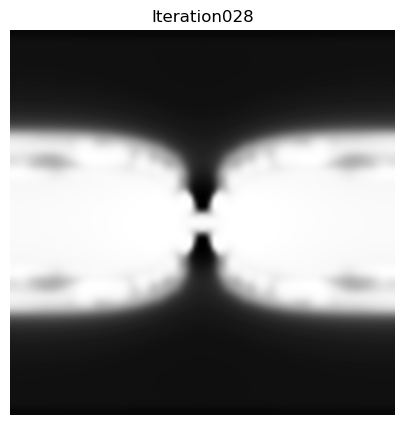

[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]
2
0.5
8
[0.84769997 0.80479316 0.7853718  ... 0.7853718  0.80479316 0.84769997]


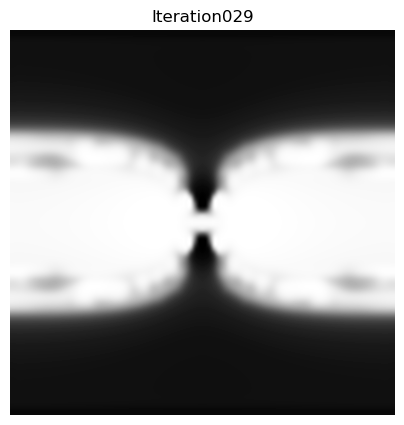

[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


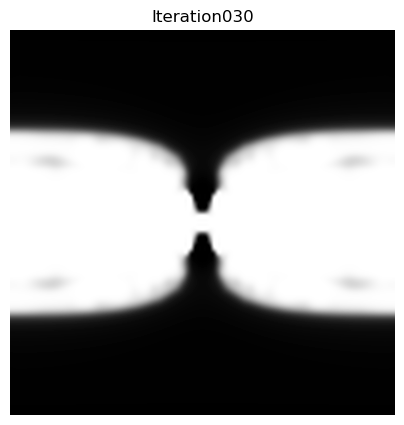

[0.84770512 0.80479877 0.78537929 ... 0.78537929 0.80479877 0.84770512]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


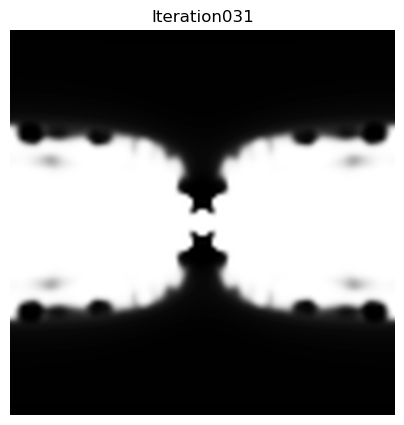

[0.8477056  0.80479935 0.78538014 ... 0.78538014 0.80479935 0.8477056 ]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


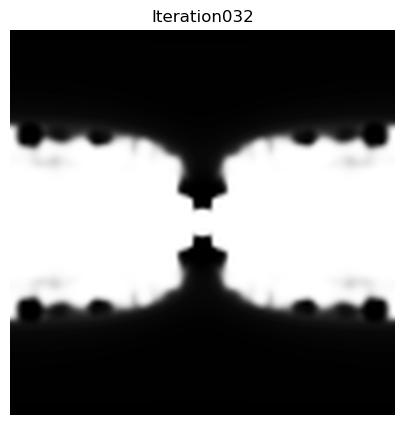

[0.84770523 0.8047989  0.78537948 ... 0.78537948 0.8047989  0.84770523]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


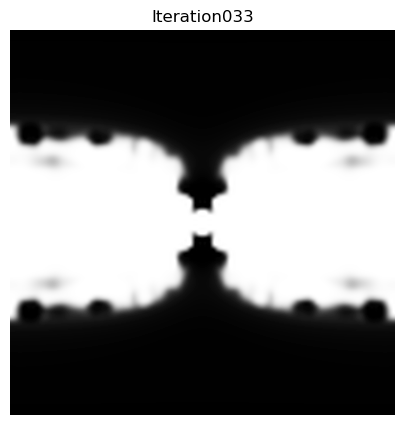

[0.84770526 0.80479893 0.78537953 ... 0.78537953 0.80479893 0.84770526]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


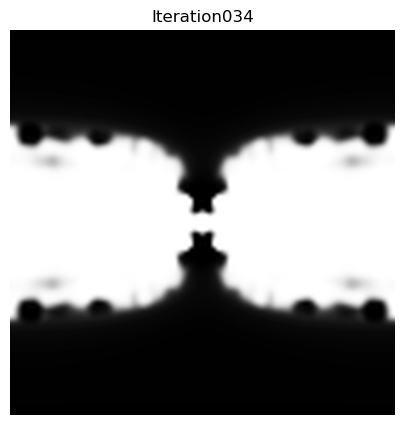

[0.84770524 0.80479891 0.78537949 ... 0.78537949 0.80479891 0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


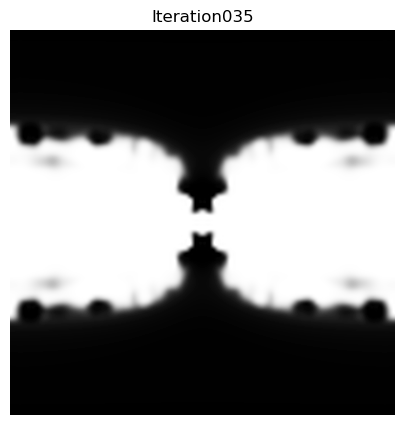

[0.84770523 0.8047989  0.78537948 ... 0.78537948 0.8047989  0.84770523]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


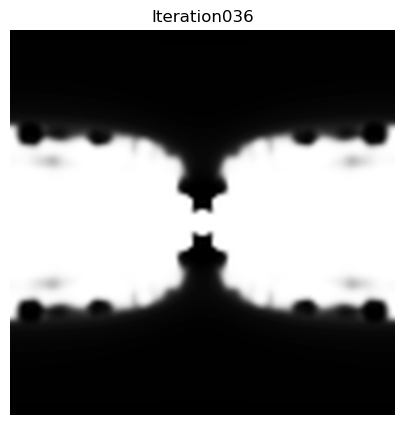

[0.84770523 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770523]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


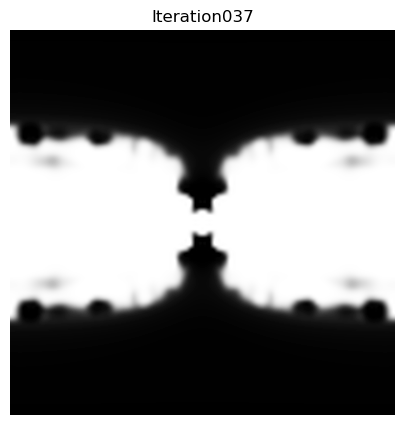

[0.84770523 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770523]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


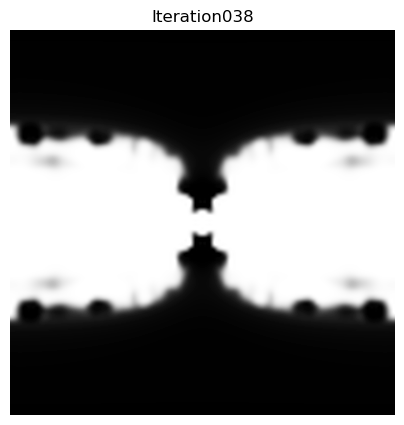

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


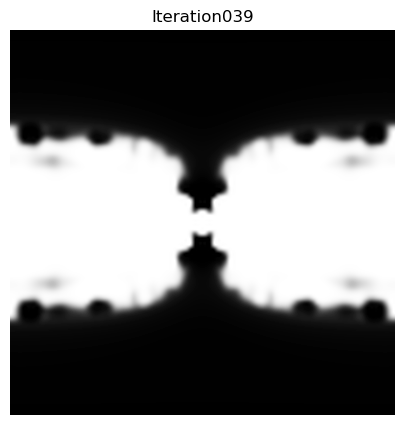

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


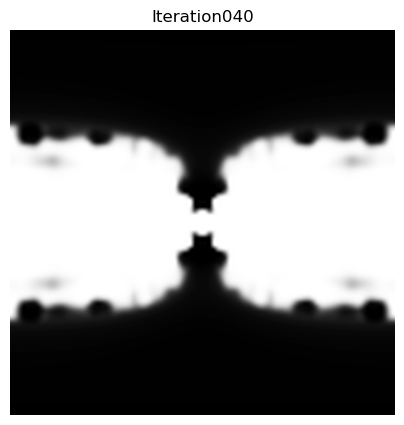

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


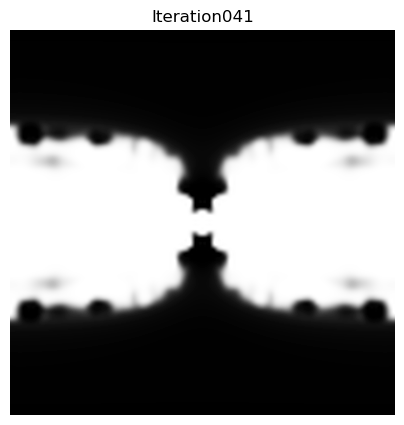

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


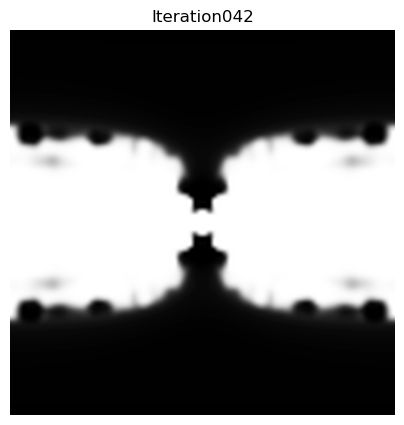

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


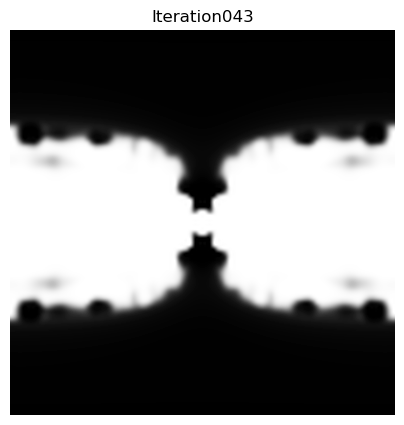

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
16
[0.84770221 0.80479519 0.78537408 ... 0.78537408 0.80479519 0.84770221]


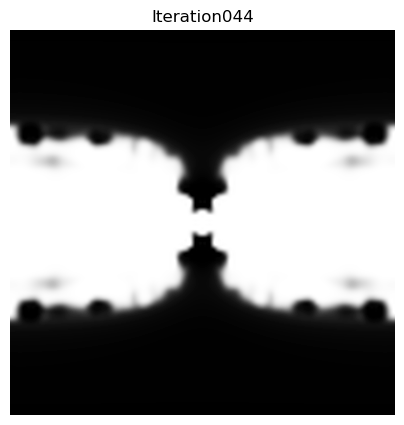

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


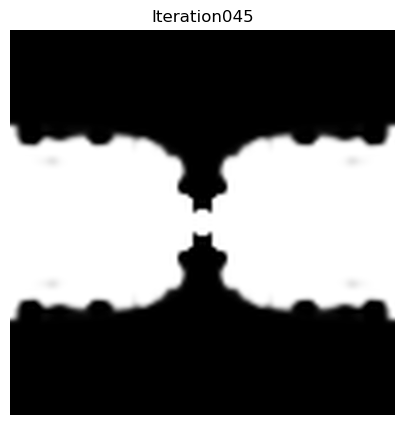

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


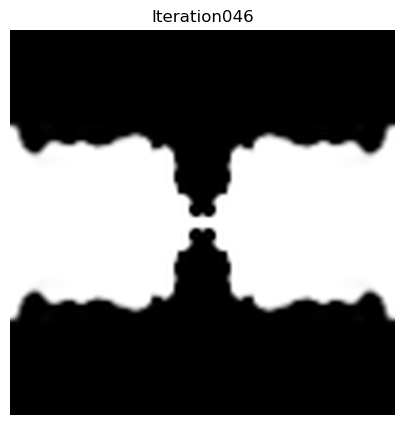

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


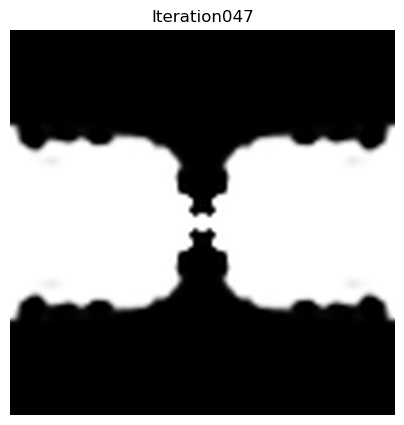

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


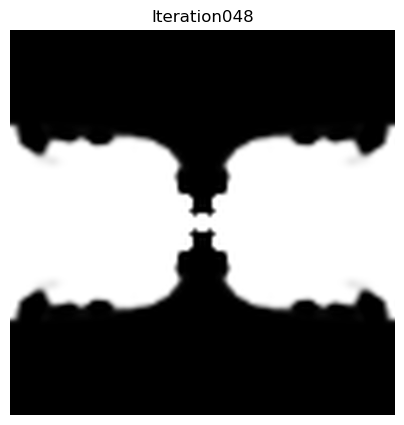

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


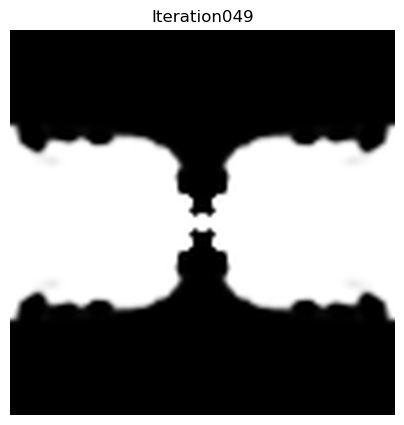

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


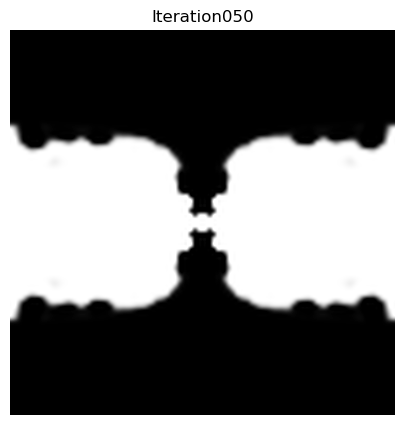

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


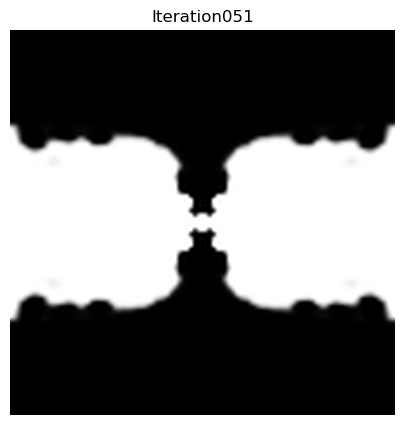

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


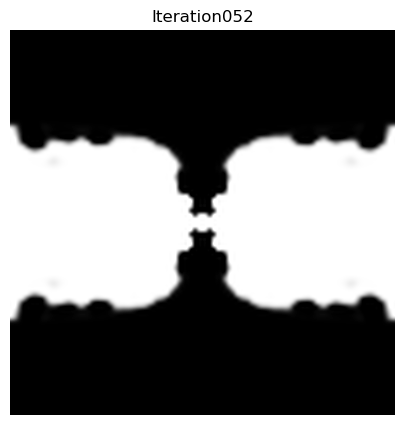

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


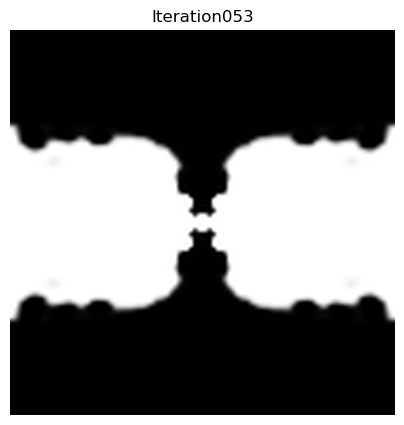

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


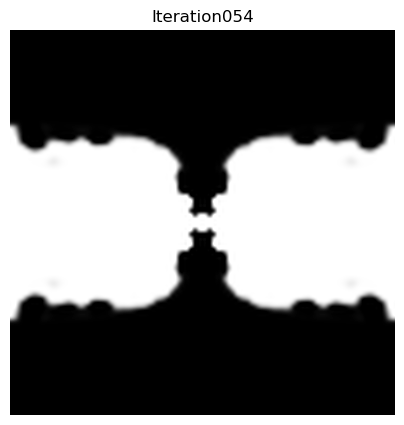

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


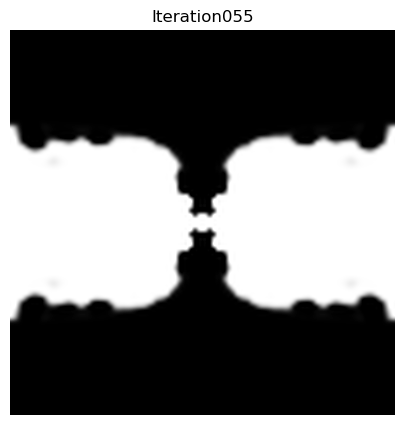

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


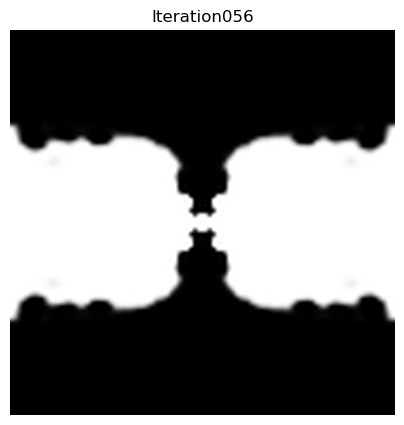

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


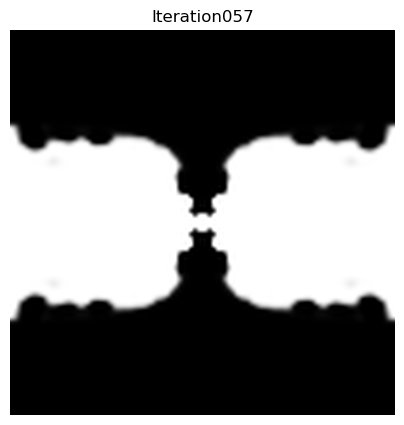

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


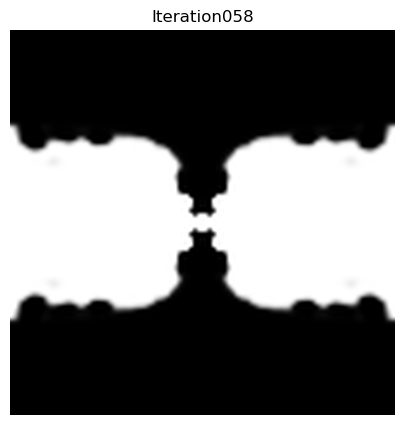

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
32
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


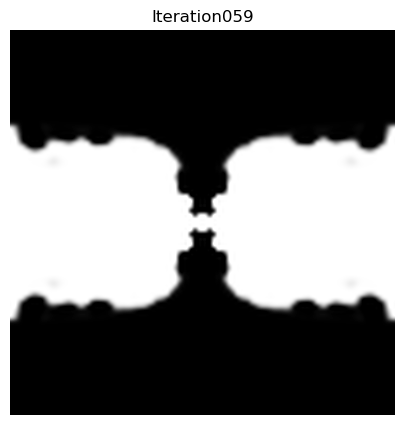

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


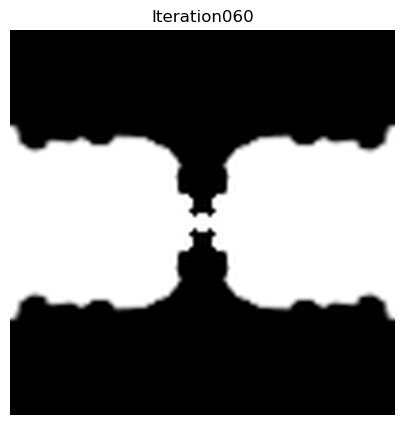

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


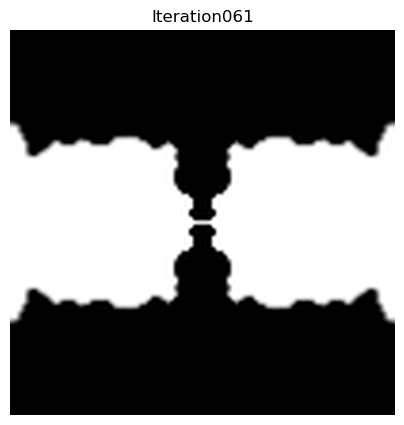

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


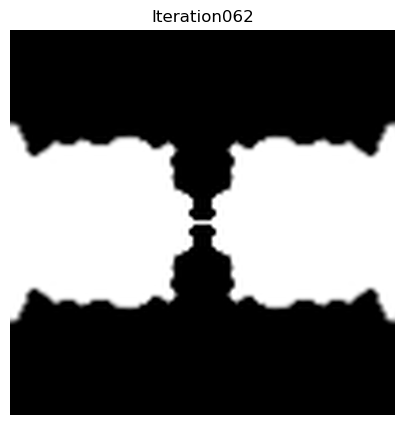

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


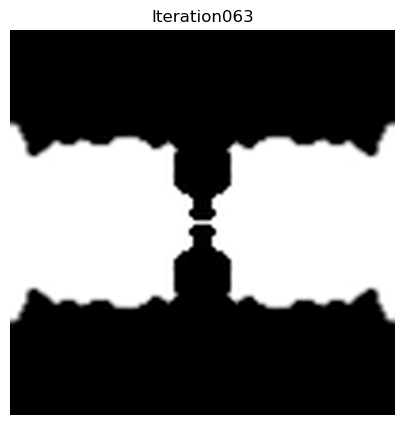

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


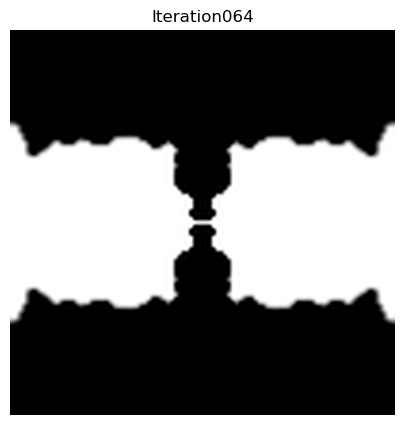

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


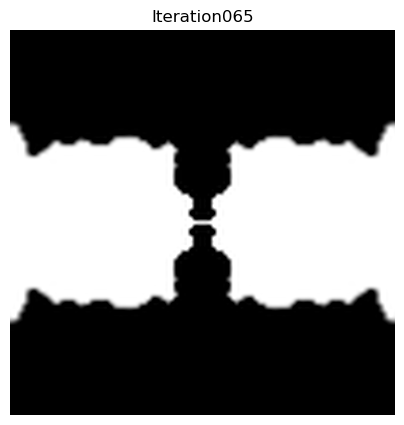

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


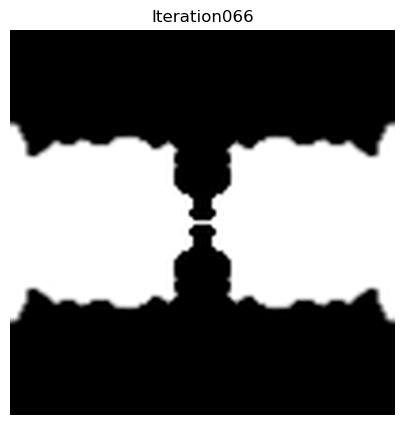

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


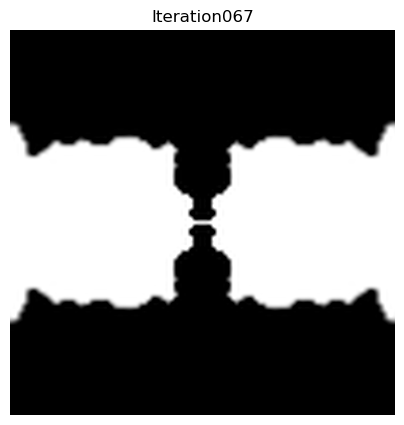

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


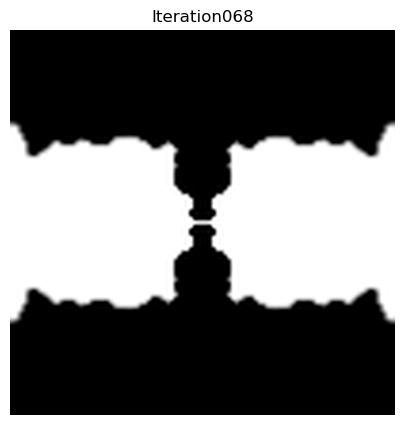

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


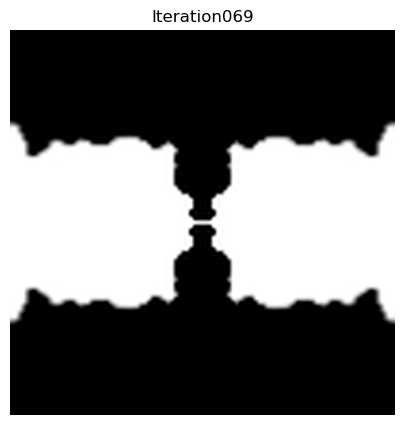

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


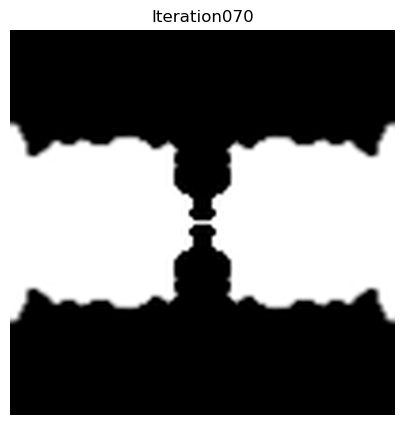

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


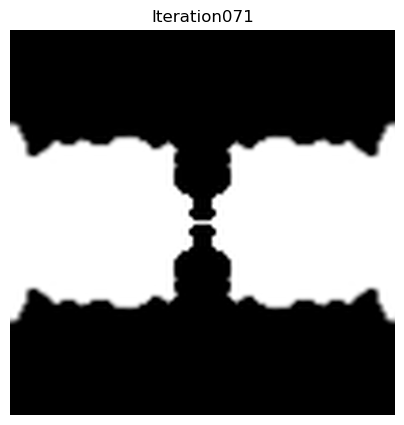

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


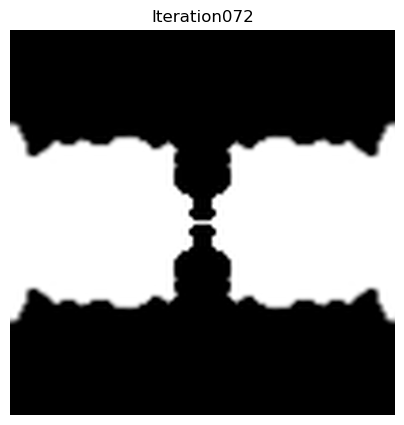

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


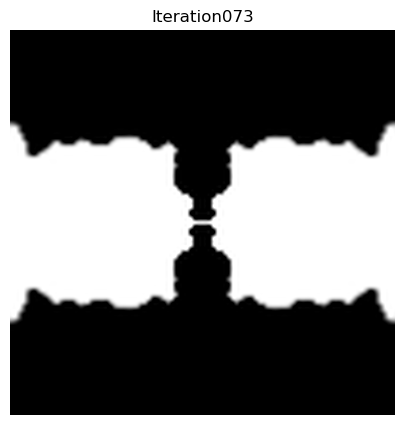

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
64
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


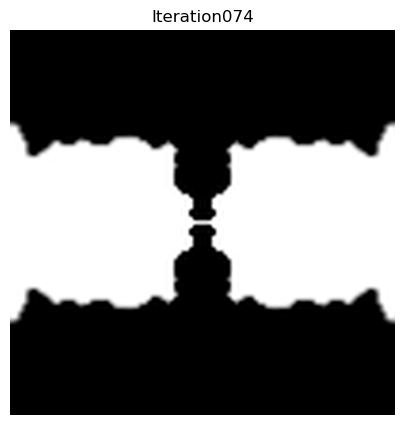

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


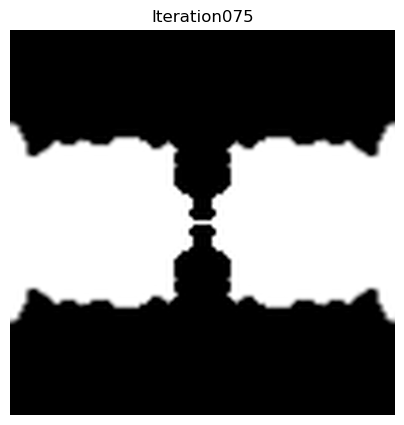

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


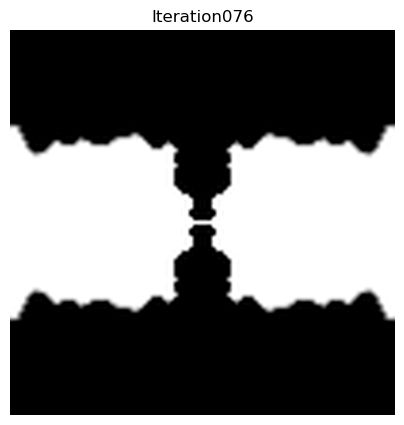

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


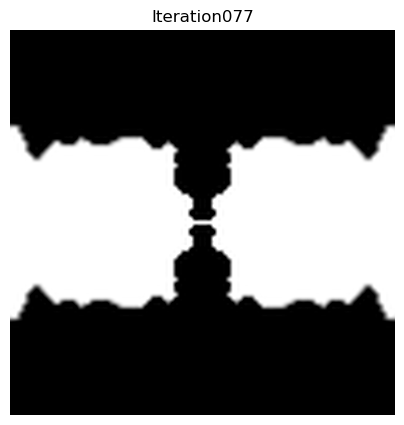

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


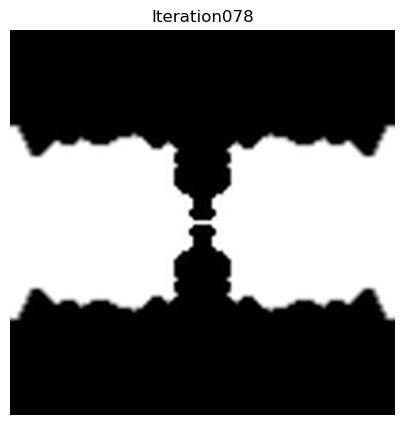

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


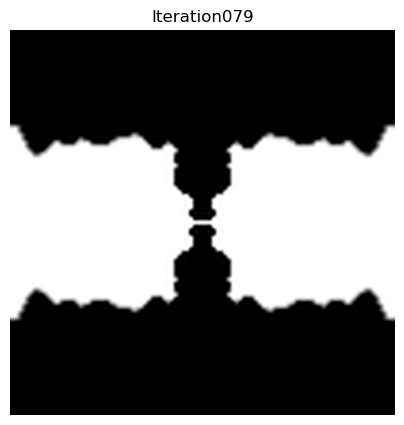

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


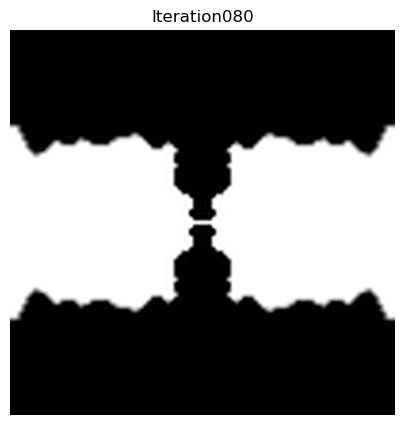

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


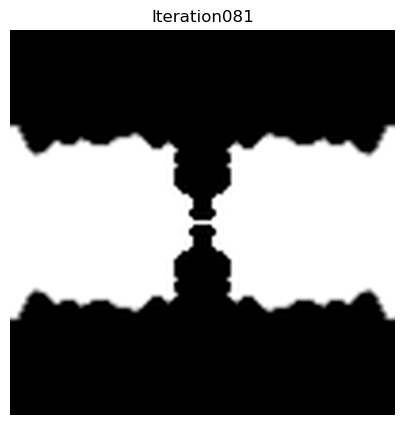

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


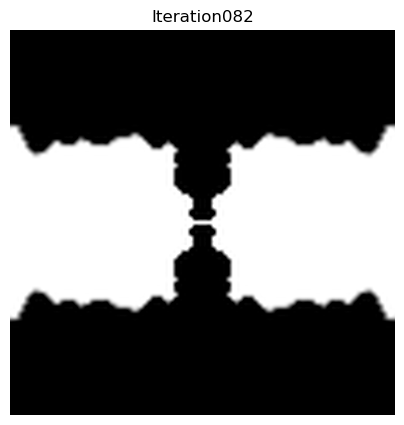

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


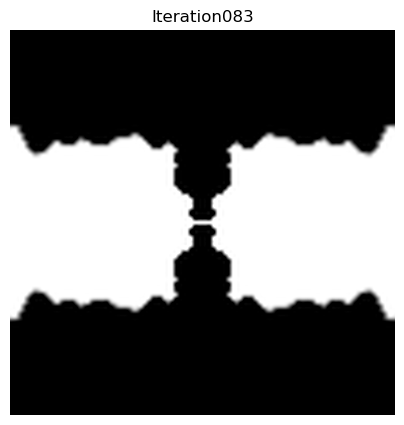

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


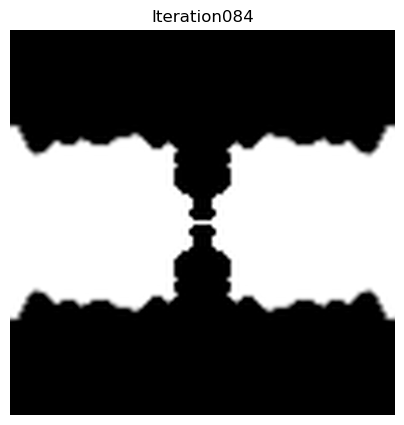

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


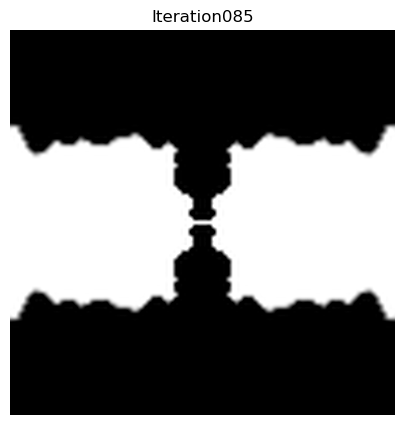

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


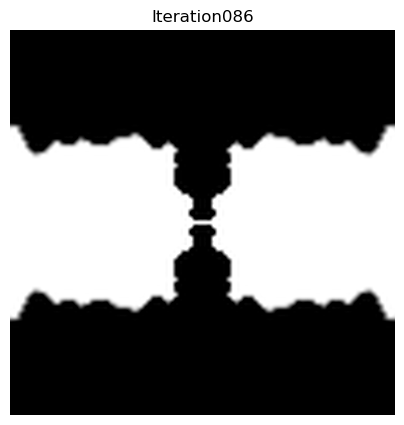

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


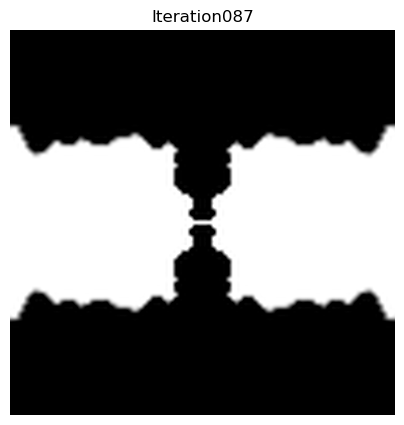

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


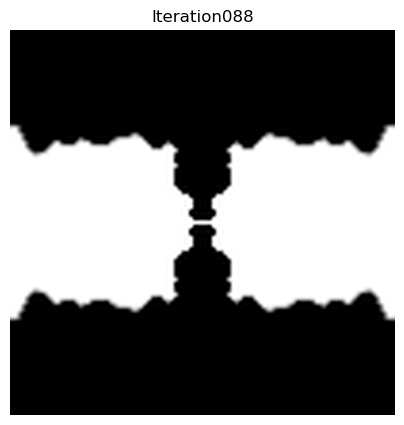

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
128
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


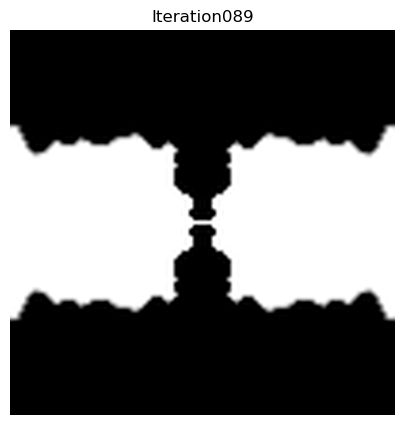

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


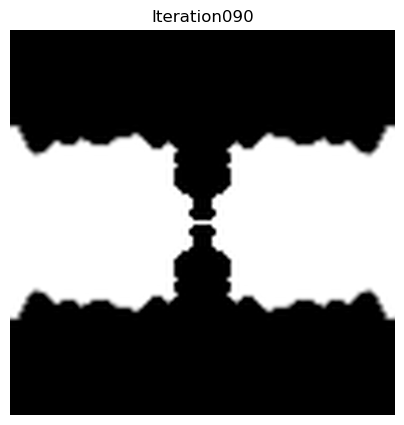

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


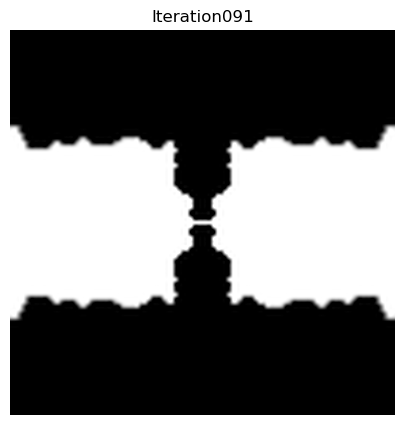

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


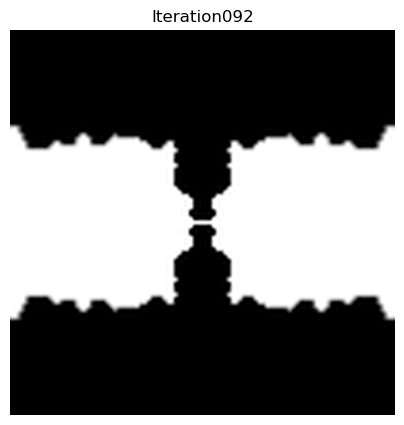

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


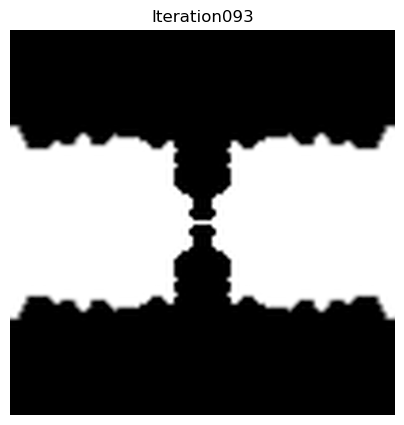

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


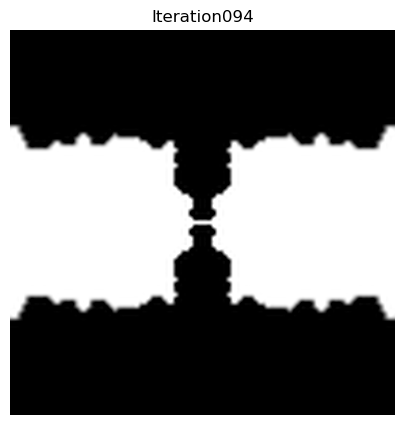

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


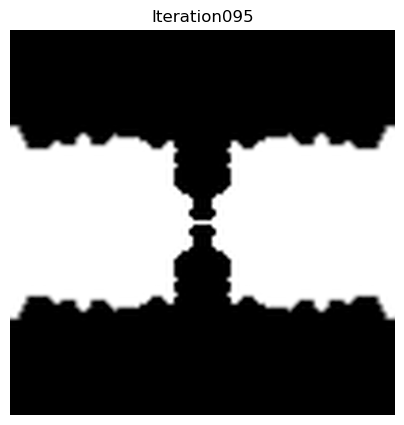

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


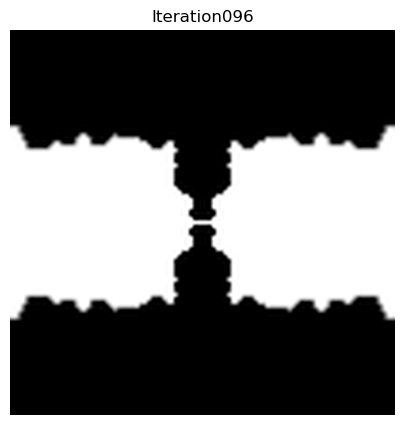

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


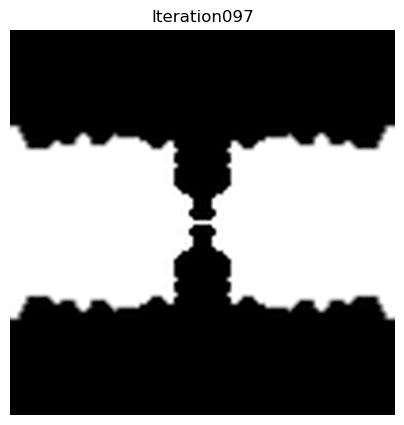

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


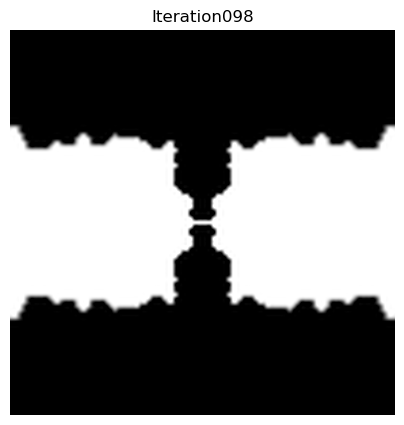

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


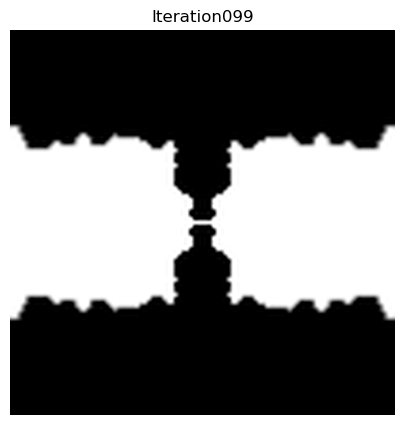

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


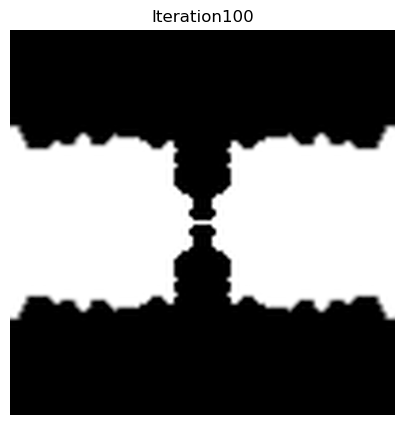

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


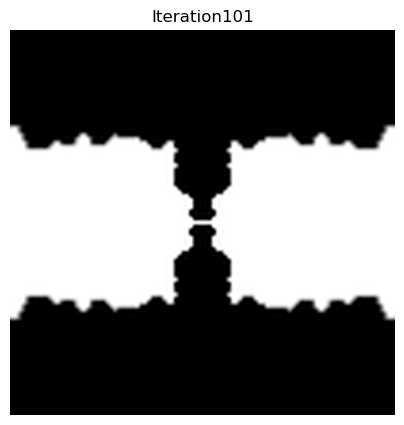

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


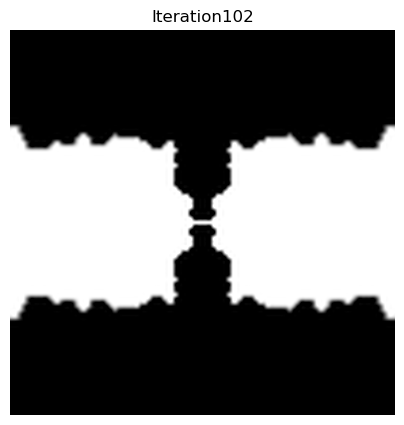

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


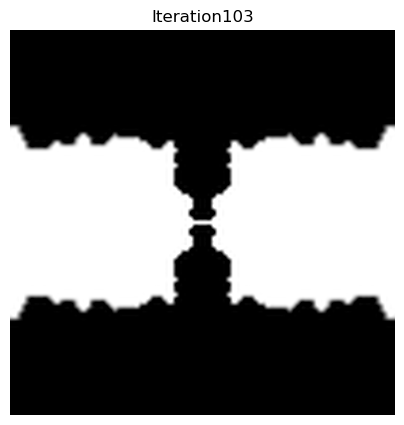

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
256
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


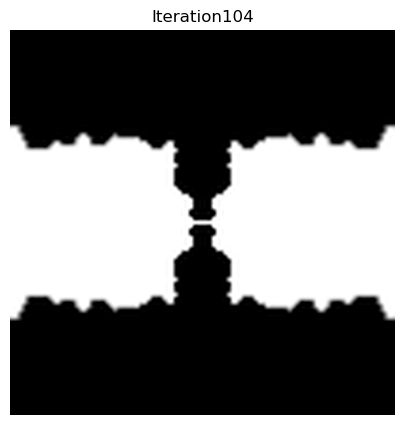

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


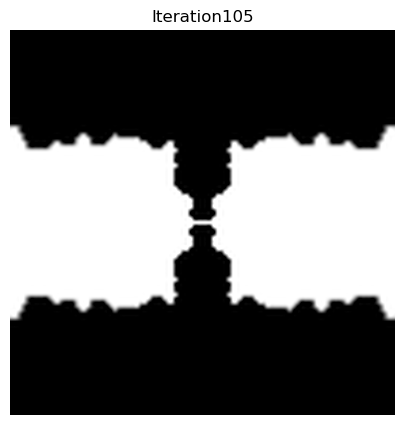

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


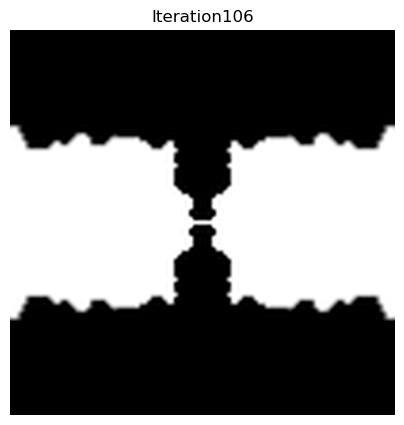

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


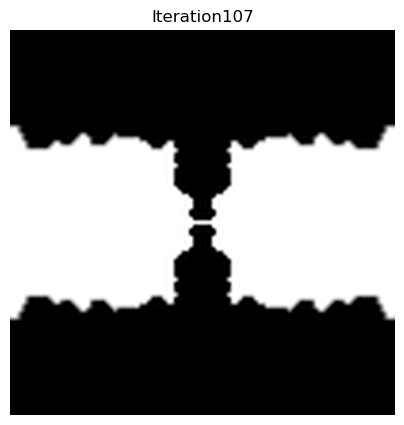

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


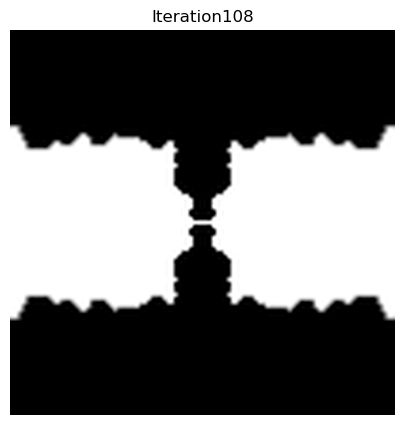

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


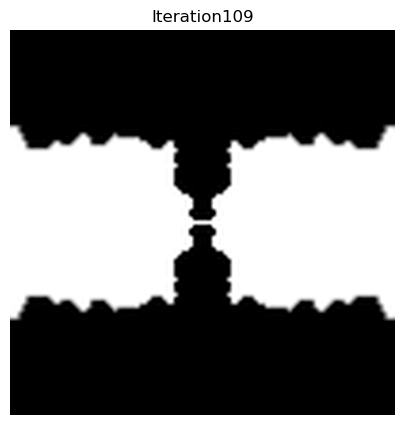

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


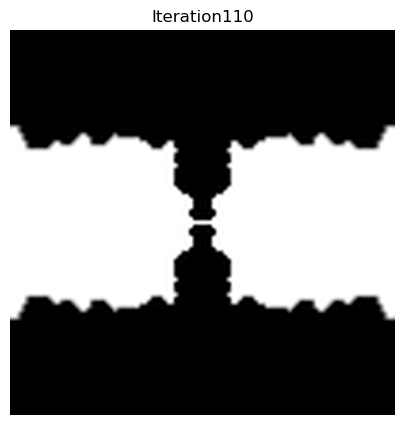

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


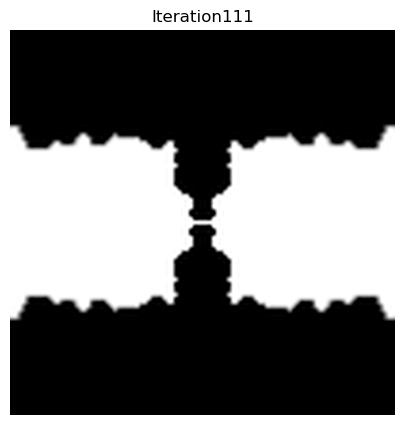

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


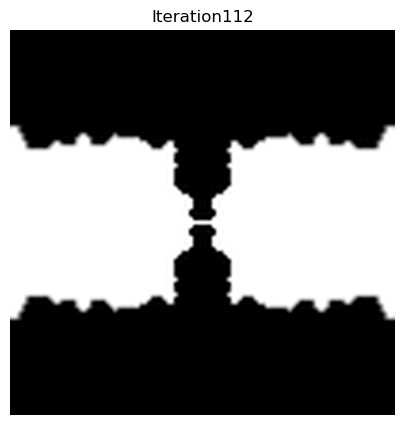

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


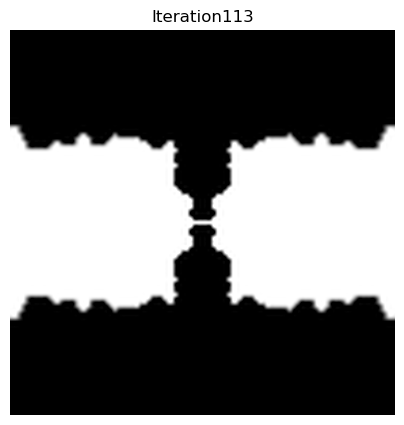

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


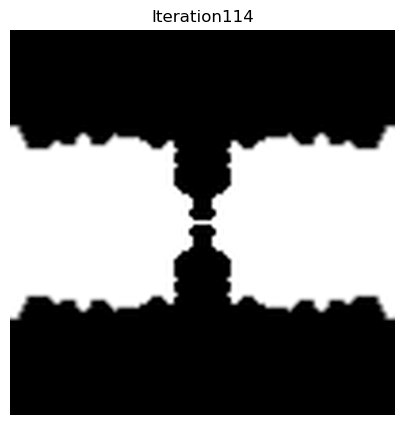

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


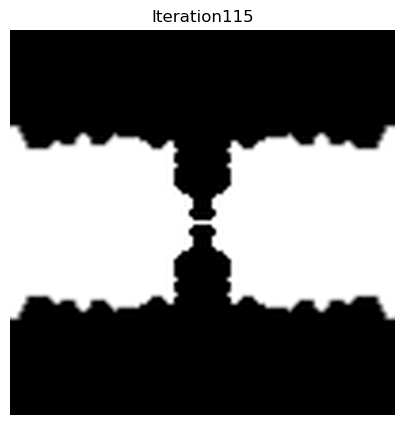

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


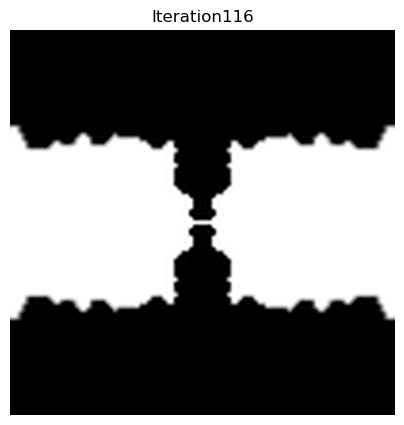

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


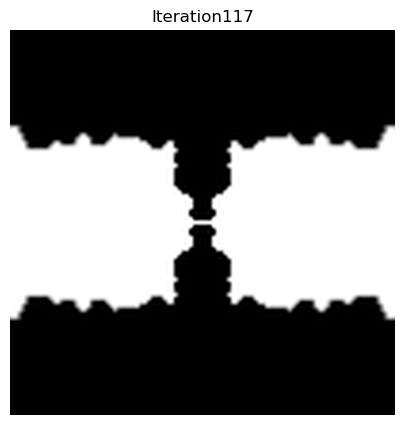

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


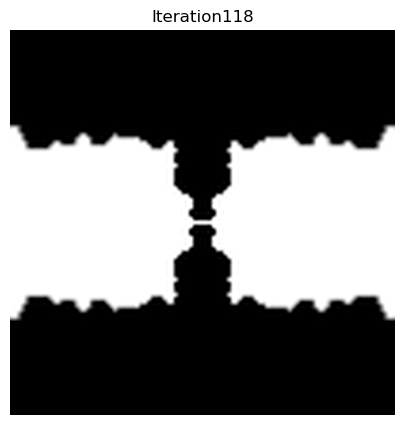

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
512
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


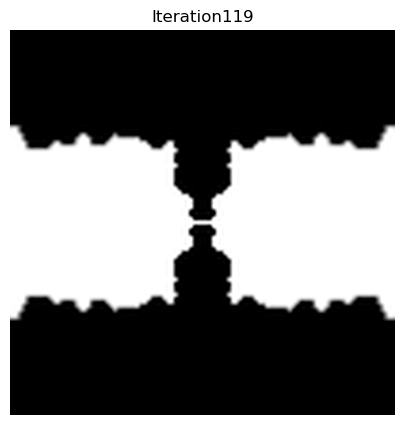

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


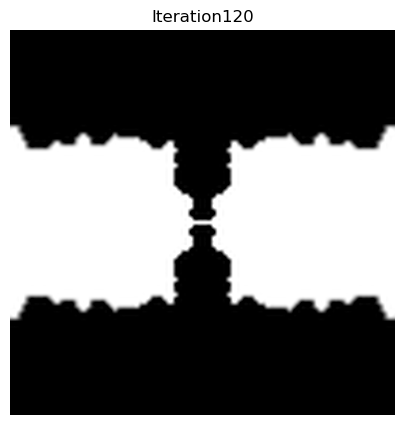

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


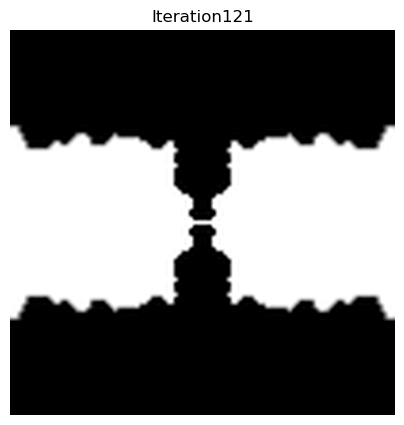

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


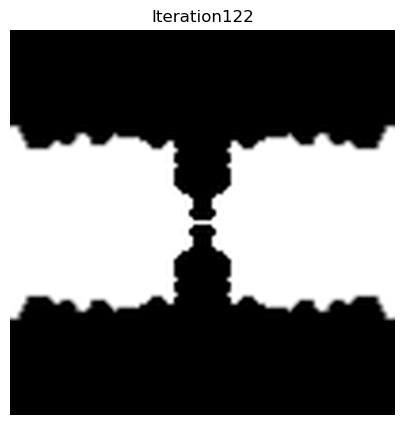

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


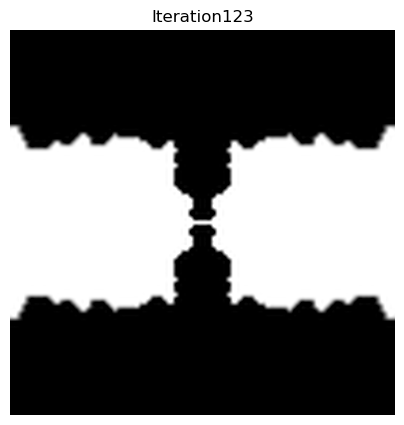

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


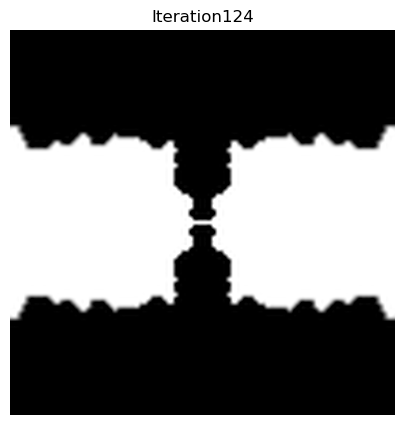

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


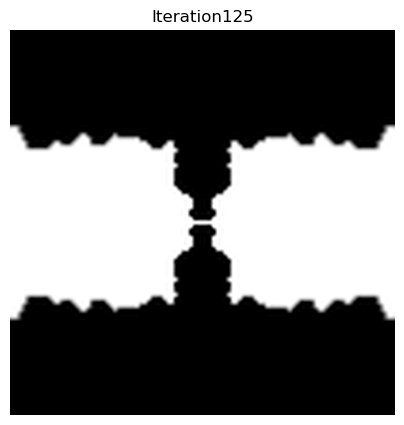

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


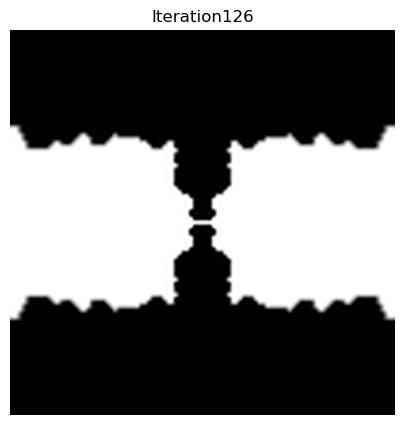

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


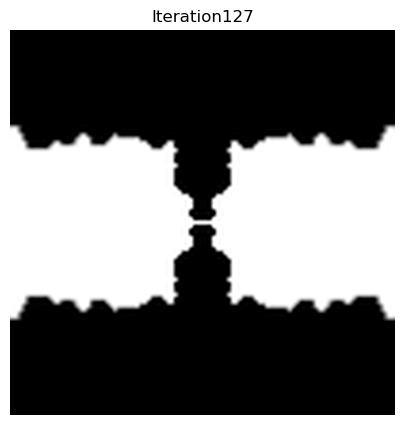

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


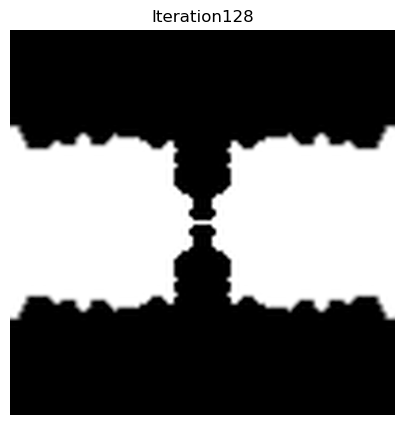

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


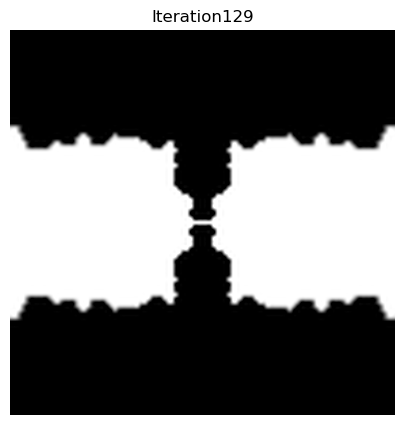

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


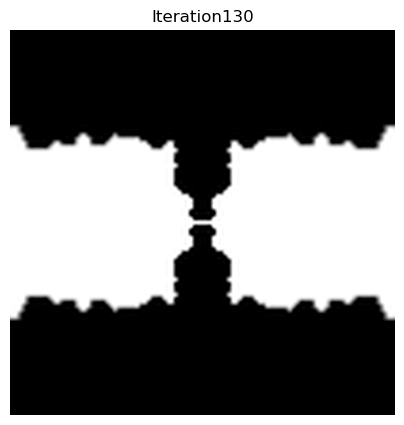

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


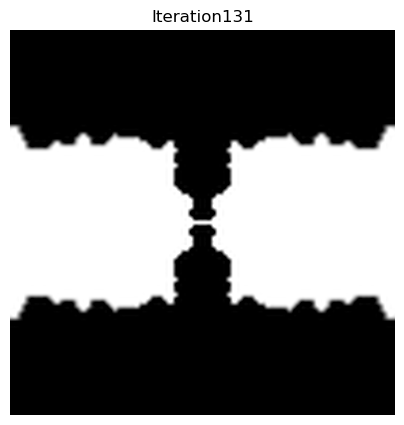

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


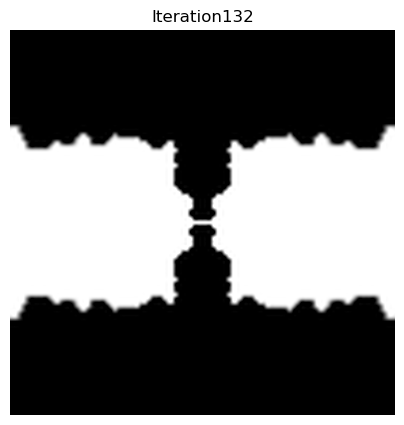

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


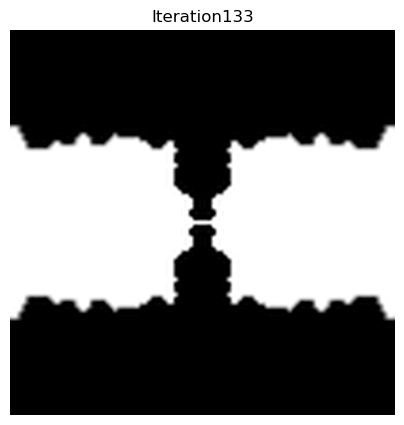

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
1024
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


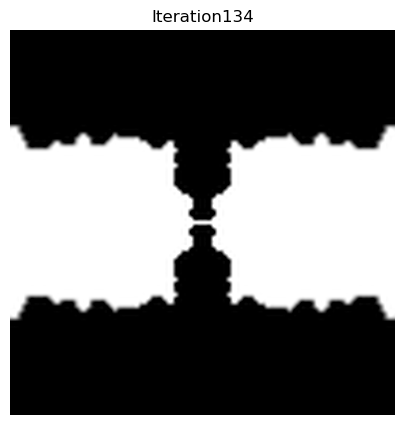

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


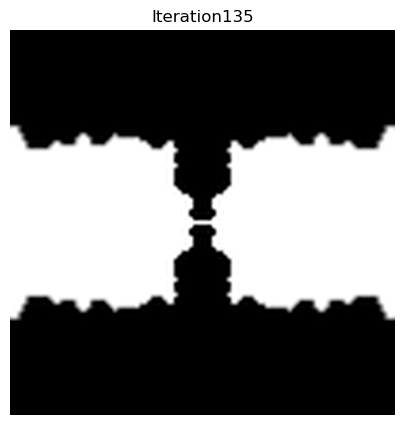

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


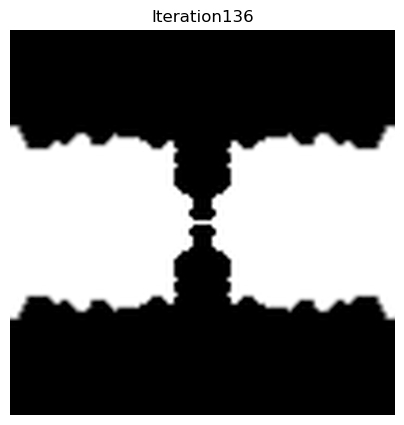

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


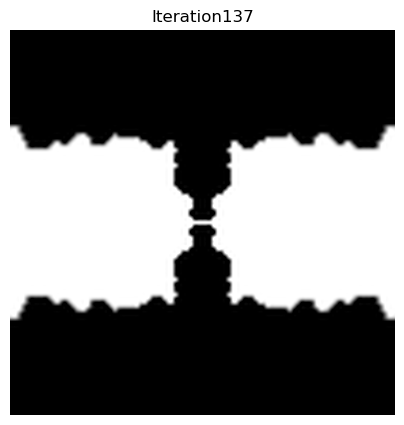

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


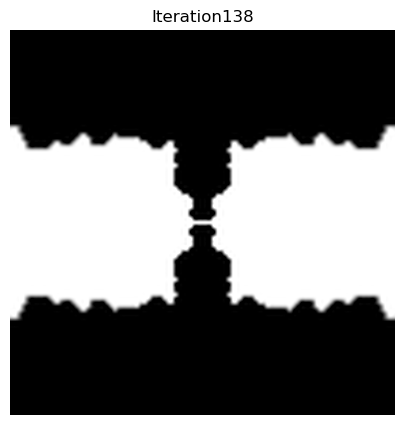

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


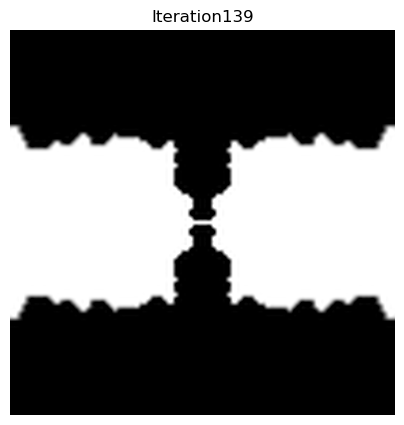

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


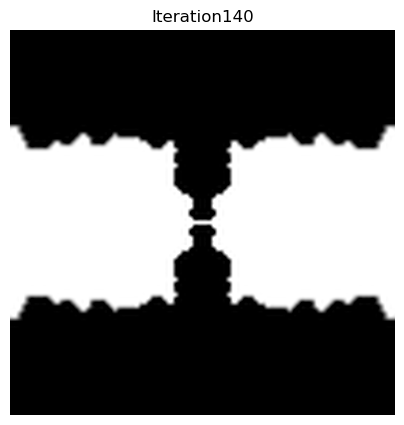

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


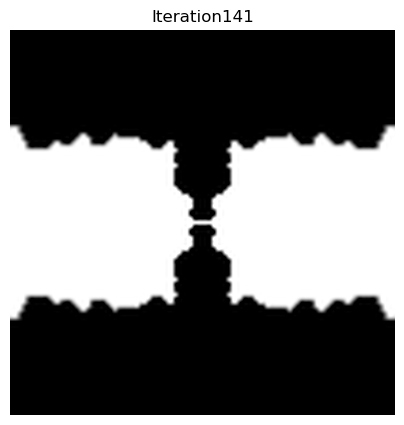

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


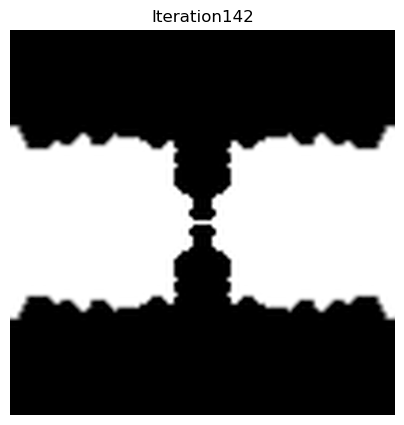

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


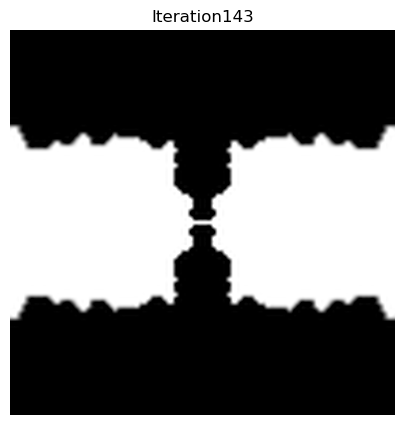

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


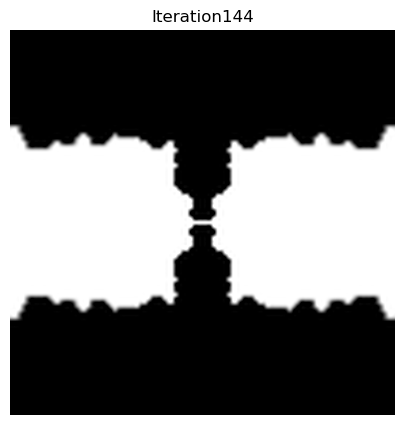

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


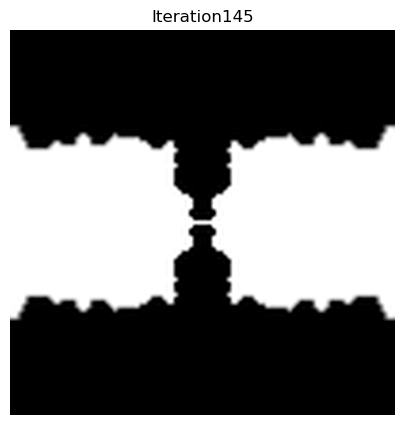

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


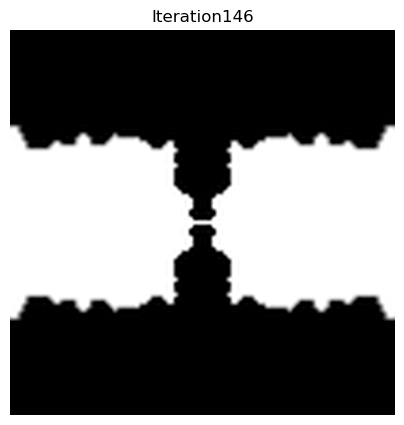

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


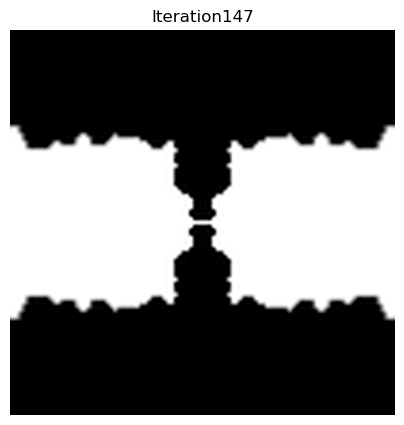

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


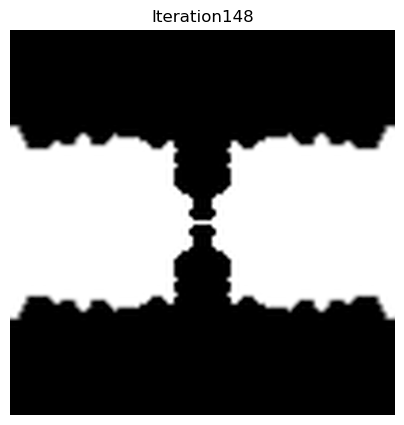

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
2048
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


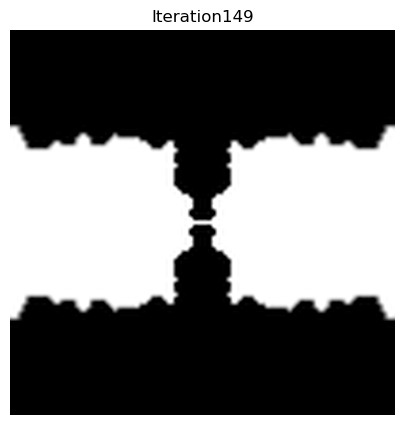

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


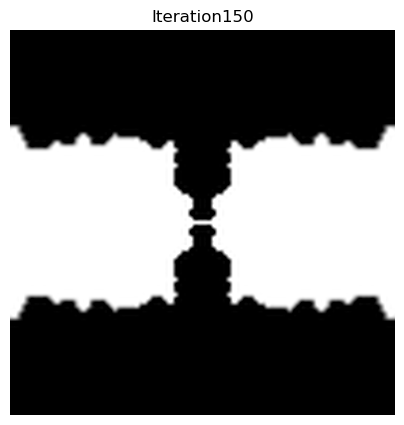

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


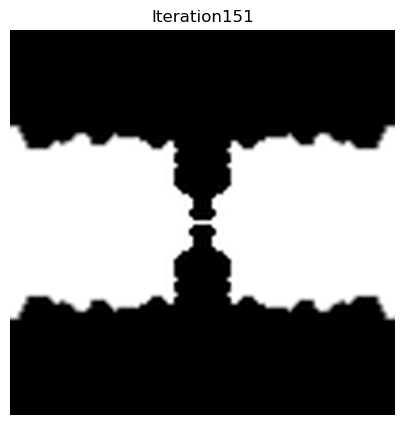

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


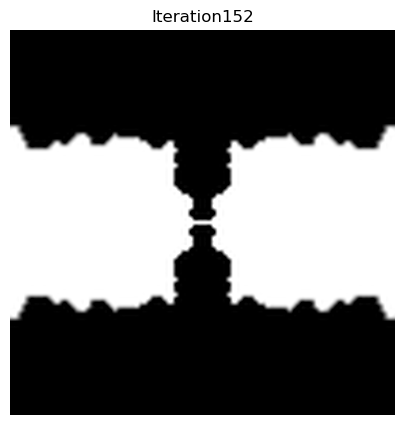

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


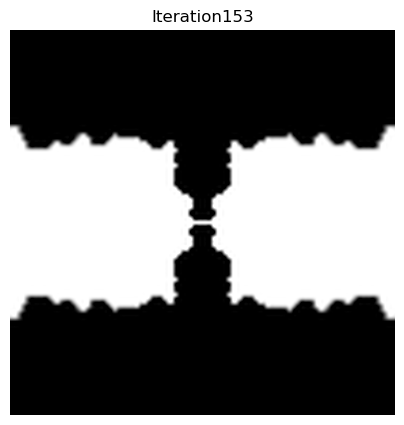

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


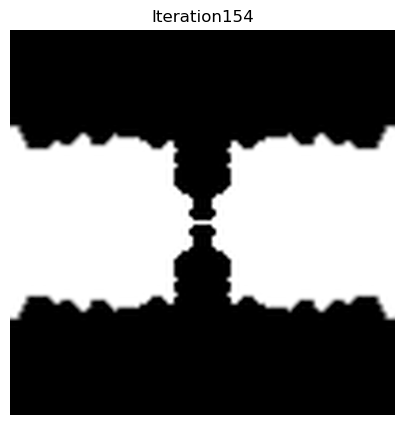

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


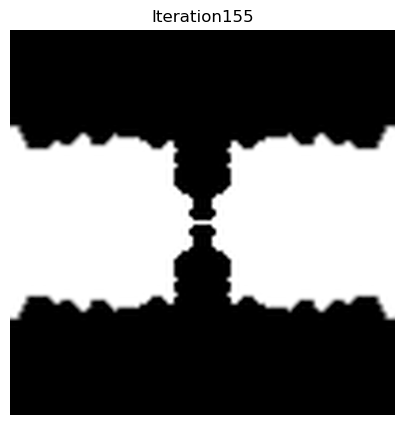

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


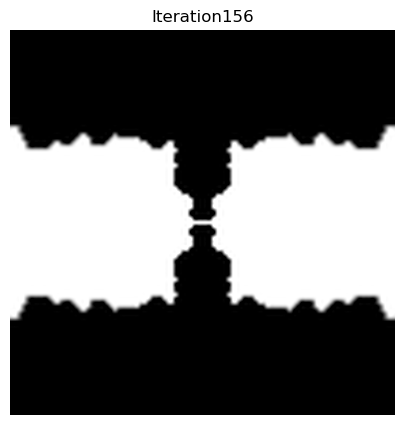

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


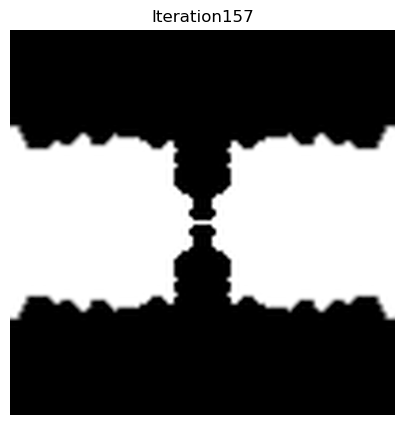

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


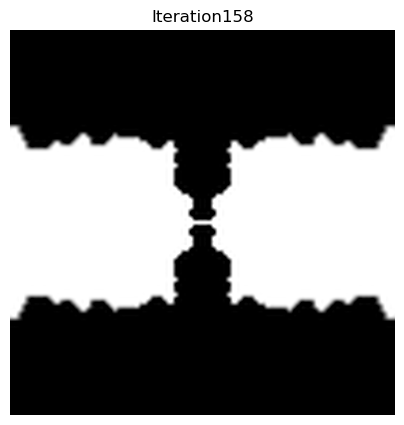

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


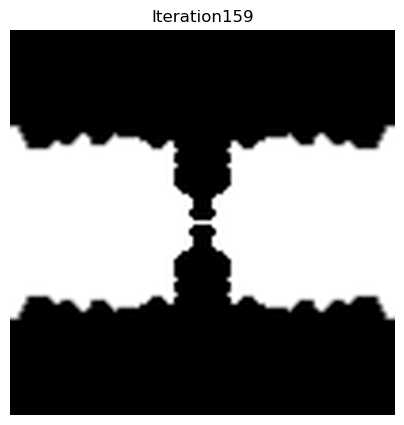

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


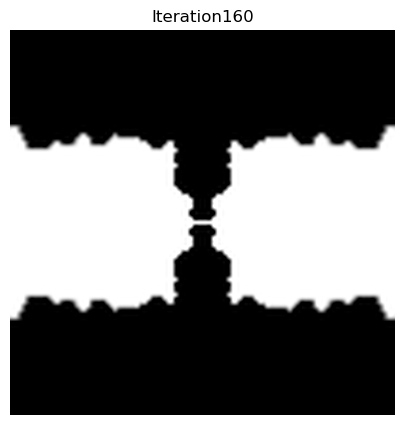

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


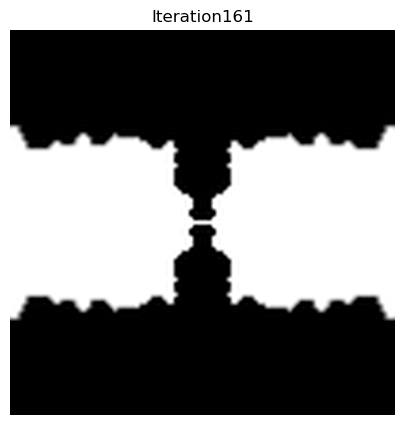

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


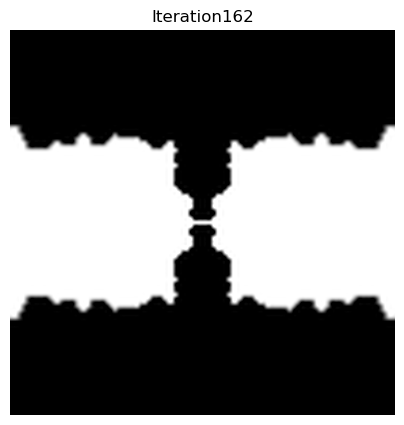

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


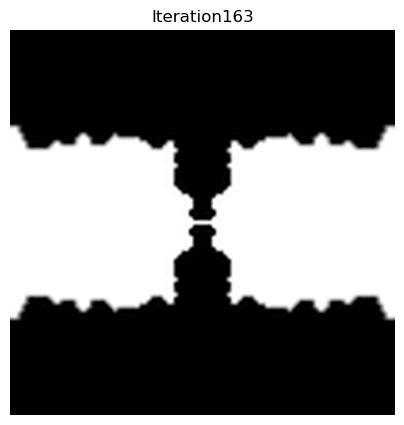

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
4096
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


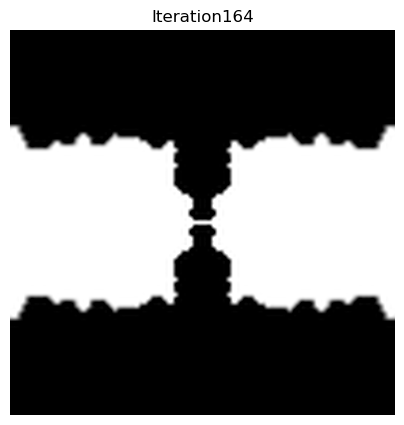

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


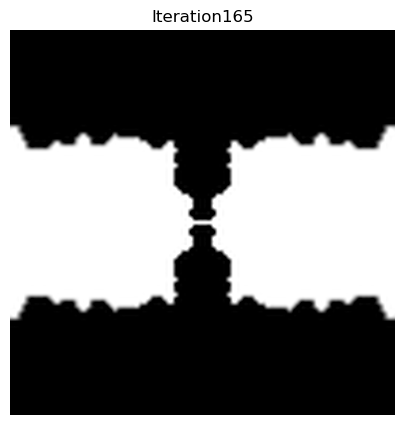

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


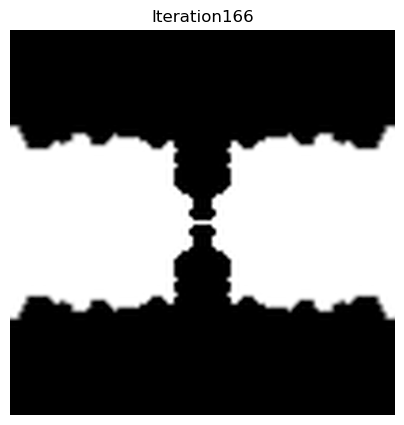

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


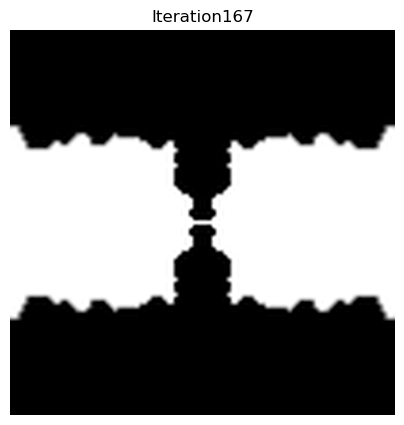

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


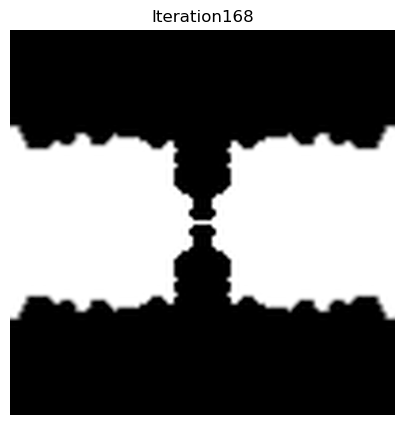

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


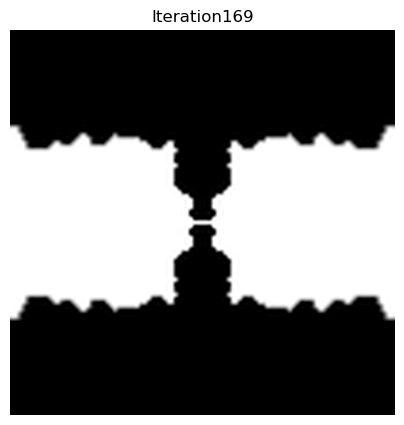

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


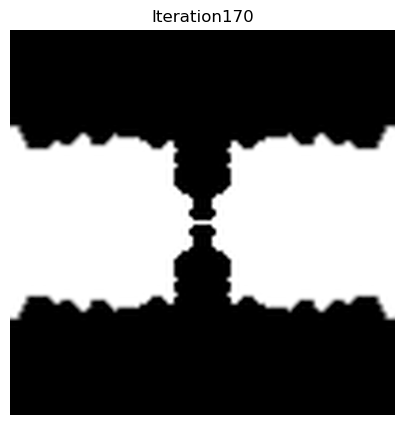

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


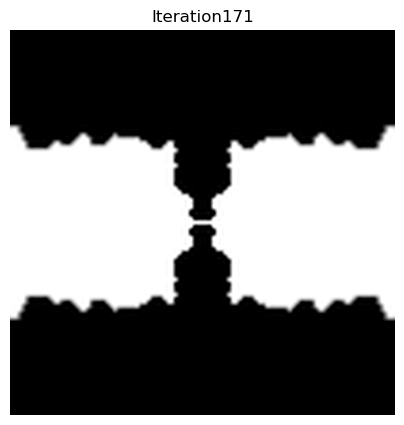

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


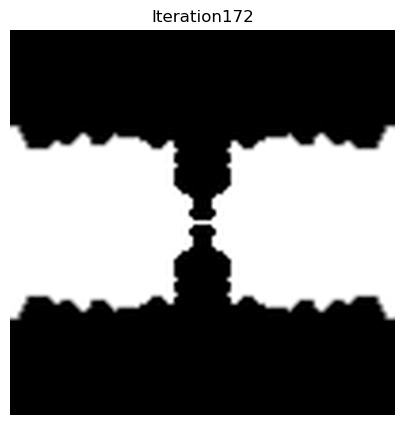

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


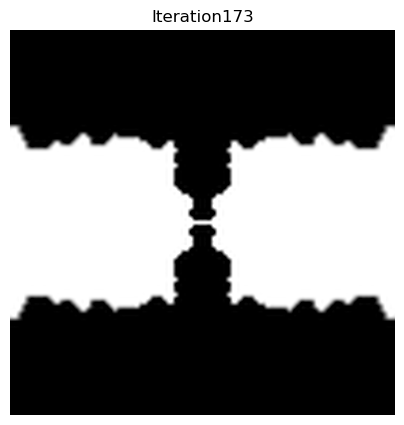

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


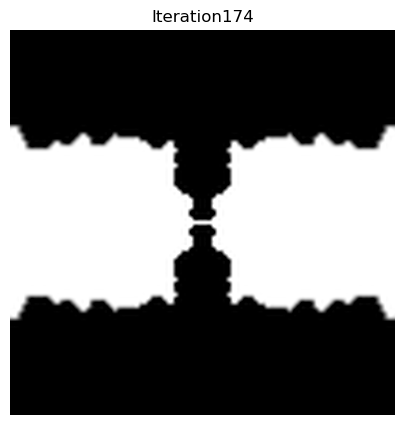

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


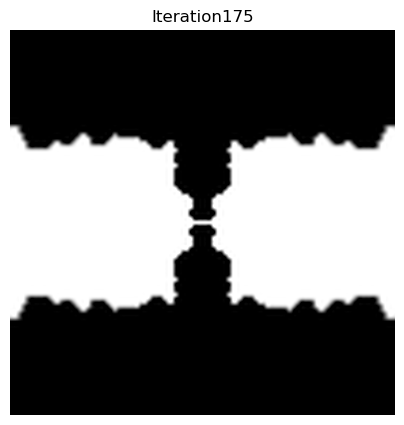

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


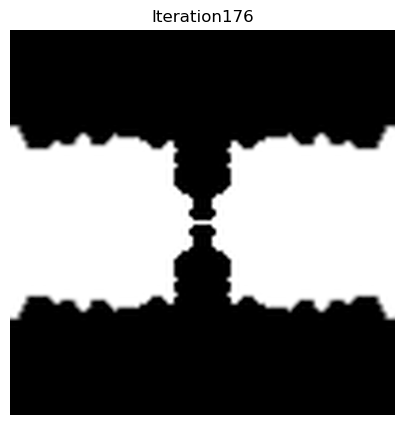

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


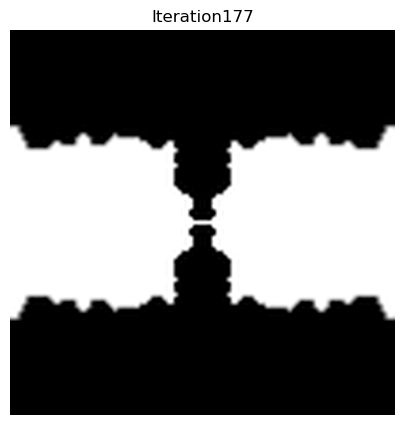

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


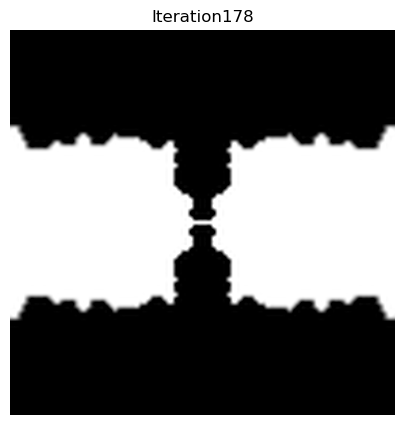

[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]
2
0.5
8192
[0.84770524 0.8047989  0.78537949 ... 0.78537949 0.8047989  0.84770524]


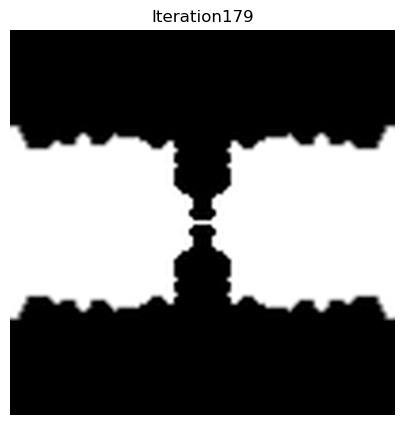

In [3]:
for i in range(1,180):
    v_array = np.load(f'Post_v_array{i:03d}.npy')
    print(v_array)
    beta_A = np.load(f'Post_beta_scale_array{i:03d}.npy')
    print(beta_A)
    eta_A = np.load(f'Post_eta_i_array{i:03d}.npy')
    print(eta_A)
    cur_A = np.load(f'Post_cur_beta_array{i:03d}.npy')
    print(cur_A)
    x_A = np.load(f'Post_x_array{i:03d}.npy')
    print(x_A)
    


    opt.update_design([mapping(v_array, eta_A, cur_A/beta_A)]) # cur_beta/beta_scale is the final beta in the optimization.
    plt.figure(figsize=(5, 5))
    plt.title(f"Iteration{i :03d}")
    ax = plt.gca()
    opt.plot2D(
        False,
        ax=ax,
        plot_sources_flag=False,
        plot_monitors_flag=False,
        plot_boundaries_flag=False,
        output_plane = mp.Volume(center=mp.Vector3(0,0,0), size=mp.Vector3(design_region_x_width, design_region_y_height, 0))
    )
    circ = Circle((2, 2), minimum_length / 2)
    ax.add_patch(circ)
    ax.axis("off")
    plt.savefig(f'PICTURE/Picture{i:03d}.png')
    plt.show()


    

In [4]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image

# Set the directory where your images are stored
image_folder = "PICTURE"
image_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(".png")])  # Adjust for JPG, etc.

# Load images using PIL
images = [Image.open(img) for img in image_files]

# Create figure and axis
fig, ax = plt.subplots()
ax.axis("off")  # Hide axis
im = ax.imshow(images[0])  # Initialize with the first image

# Animation function
def update(frame):
    im.set_array(images[frame])
    return [im]

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(images), interval=200, blit=True)
plt.close(fig)
# Display in Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [5]:
# Convert images to GIF
output_gif = "animation.gif"

# Save images as an animated GIF
images[0].save(
    output_gif,
    save_all=True,
    append_images=images[1:],
    duration=200,  # 每幀持續時間 (毫秒)
    loop=0         # 0 表示無限循環
)

print(f"GIF 已儲存至 {output_gif}")

GIF 已儲存至 animation.gif
